In [1]:
import glob
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import seaborn as sns
from scipy.stats import linregress

ERROR 1: PROJ: proj_create_from_database: Open of /nesi/project/niwa00018/rampaln/envs/ml_env_v2/share/proj failed
<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


# Need to find large ensemble for Precip and Temperature

In [2]:
def get_ensemble_season(season = 'JJA', varname ='PR'):
    files_ai = glob.glob(f'//nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output_v3/historical/static_maps/{varname}/*base_bp1986-2005_{season}_NZ12km.nc')
    dfs = []
    gcms = []
    for file in files_ai:
        df = xr.open_dataset(file)
        dfs.append(df.squeeze().drop("time"))
        gcm = file.split('/')[-1].split('_')[2]
        variant = file.split('/')[-1].split('_')[3]
        gcm_string = f'{gcm}_{variant}'
        gcms.append(gcm_string)
    #concat = xr.concat(dfs, dim ="GCM")
    #gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
    concat = xr.concat(dfs, dim ="GCM_variant")
    concat['GCM_variant'] =(('GCM_variant'), gcms)
    return concat

In [3]:
season ='DJF'
# Obtain historical Emulator Data

In [4]:
season ='DJF'
# Obtain historical Emulator Data
precip_Emul = get_ensemble_season(season =season, varname ='PR')
tasmax_Emul = get_ensemble_season(season =season, varname ='TX')
Txx_Emul = get_ensemble_season(season ='ANN', varname ='TXx')
rx1day_Emul = get_ensemble_season(season ='ANN', varname ='Rx1day')

In [5]:
observations = xr.open_dataset(r'/nesi/project/niwa00018/gibsonp/dload_data/VCSN_Rain_Council/rainfall_council_ni_si_start_cumulation.nc').isel(time = slice(0,100)).mean("time")#.sel(time = slice("1986","2005"))
mask = (~observations.isnull()).rain_council

In [6]:
era5_data_v2 = xr.open_dataset(r"/nesi/project/niwa00018/ML_downscaling_CCAM/Training_CNN/inputs/ERA5/ERA5_training_dataset_22_4_25_remapcon.nc")
true_climo = era5_data_v2.sel(time = slice("1986","2005")).groupby('time.season').mean()
historical_data = glob.glob(r'/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/*/*/historical/r*/day/CMIP_*_*_historical_*_day_*_v????????.nc', recursive = True)
dfs = []
gcms = []
for file in historical_data:
    print(file)
    df = xr.open_dataset(file).sel(time = slice("1986","2005"))
    df['plev'] = np.array(df.plev.values, dtype ='int32')
    dfs.append(df.sel(plev = [85000, 50000]).groupby('time.season').mean())
    gcm = file.split('/')[8]
    variant = file.split('/')[-3]
    gcm_string = f'{gcm}_{variant}'
    gcms.append(gcm_string)
dsets = xr.concat([df[['ua','va','ta','hus']] for df in dfs], dim ="GCM_variant")
dsets['GCM_variant'] = (('GCM_variant'), gcms)
dsets1 = dsets.copy()
dsets1 = dsets1.rename({"ua":"u","va":"v","hus":"q","ta":"t"})
for varname in ['u','v','q','t']:
    for plev in dsets1.plev.values:
        dsets1[f'{varname}_{int(plev/100)}'] = dsets1[varname].sel(plev = plev)
    dsets1 = dsets1.drop(varname)
error_climo = dsets1 - true_climo# - dsets1

/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/CNRM-CERFACS/CNRM-CM6-1/historical/r1i1p1f2/day/CMIP_CNRM-CERFACS_CNRM-CM6-1_historical_r1i1p1f2_day_gr_v20180917.nc
/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/NCAR/CESM2-WACCM/historical/r1i1p1f1/day/CMIP_NCAR_CESM2-WACCM_historical_r1i1p1f1_day_gn_v20190227.nc
/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/MOHC/UKESM1-0-LL/historical/r1i1p1f2/day/CMIP_MOHC_UKESM1-0-LL_historical_r1i1p1f2_day_gn_v20190627.nc
/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/NASA-GISS/GISS-E2-1-G/historical/r1i1p1f2/day/CMIP_NASA-GISS_GISS-E2-1-G_historical_r1i1p1f2_day_gn_v20190903.nc
/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/CCCR-IITM/IITM-ESM/historical/r1i1p1f1/day/CMIP_CCCR-IITM_IITM-ESM_historical_r1i1p1f1_day_gn_v20210203.nc
/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/CCCma/CanESM5/historical/r2i1p1f1/day/CMIP_CCCma_CanESM5_historical_r2i1p

In [16]:
dsets1.to_netcdf(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/data/GCM_circulation_biases.nc')

In [178]:
def compute_obs_metrics():
    observations = xr.open_dataset(r'/nesi/project/niwa00018/gibsonp/dload_data/VCSN_Rain_Council/rainfall_council_ni_si_start_cumulation.nc').sel(time = slice("1986","2005"))
    tasmax_obs = xr.open_dataset(r'/nesi/project/niwa00004/ML_DATA/VCSN/temperature_maximum/tmax_N/VCSN_Tmaxn5k_1972-2018.nc').sel(time = slice("1986","2005")).ffill("latitude",limit =1).ffill("longitude",limit =1)
    tasmax_obs = tasmax_obs.interp(latitude = observations.latitude, longitude = observations.longitude, method ='nearest', kwargs = dict(fill_value ='extrapolate'))
    rx1day = observations.groupby('time.year').max().mean("year")
    txx = tasmax_obs.groupby('time.year').max().mean("year")
    ann_precip = observations.groupby('time.season').mean()#.mean("year")
    ann_tasmax = tasmax_obs.groupby('time.season').mean()#.mean("year")
    return ann_precip, ann_tasmax, rx1day, txx

def compute_perfect_model_metrics():
    perfect_model = xr.open_dataset(r'//nesi/project/niwa00018/ML_downscaling_CCAM/multi-variate-gan/outputs/apply_model_perfect/all_vars.nc').sel(time = slice("1986","2005"), GCM =['ACCESS-CM2', 'EC-Earth3', 'NorESM2-MM'])
    perfect_model_ann =perfect_model.pr.groupby('time.season').mean()#.#mean("year")
    perfect_model_rx1day =perfect_model.pr.groupby('time.year').max().mean("year")
    perfect_model_ann_tasmax =perfect_model.tasmax.groupby('time.season').mean()#.mean("year")
    perfect_model_txx =perfect_model.tasmax.groupby('time.year').max().mean("year")    
    return perfect_model_ann, perfect_model_rx1day,perfect_model_ann_tasmax, perfect_model_txx

def get_ccam_indicators():
    ccam_historical = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/CCAM_P_T_indicators.nc')
    rx1day_ccam = ccam_historical.Rx1day.sel(year = slice("1986","2005")).mean("year")
    txx_ccam = ccam_historical.TXx.sel(year = slice("1986","2005")).mean("year")
    ann_precip_ccam = ccam_historical.seasonal_pr_hist* 86400
    ann_tasmax_ccam = ccam_historical.seasonal_tasmax_hist
    return ann_precip_ccam, ann_tasmax_ccam, rx1day_ccam, txx_ccam
def interp_data(df):
    try:
        df = df.interp(lat = precip.latitude, lon = precip.longitude,method ='nearest', kwargs =dict(fill_value ='extrapolate'))
    except:
        df = df.interp(latitude = precip.latitude,
                       longitude = precip.longitude, method ='nearest', kwargs =dict(fill_value ='extrapolate'))
    return df
        


In [179]:
precip, tasmax, rx1day, txx = compute_obs_metrics()

In [180]:
perfect_model_ann, perfect_model_rx1day,perfect_model_ann_tasmax, perfect_model_txx = compute_perfect_model_metrics()

In [181]:
ann_precip_ccam, ann_tasmax_ccam, rx1day_ccam, txx_ccam  = get_ccam_indicators()

In [188]:
rx1day 

<xarray.Dataset>
Dimensions:       (latitude: 268, longitude: 248)
Coordinates:
  * latitude      (latitude) float64 -47.47 -47.42 -47.37 ... -34.17 -34.12
  * longitude     (longitude) float64 166.3 166.4 166.4 ... 178.6 178.6 178.7
Data variables:
    rain_council  (latitude, longitude) float32 nan nan nan nan ... nan nan nan

In [182]:
txx = interp_data(txx)
rx1day = interp_data(rx1day)
tasmax = interp_data(tasmax)

In [183]:
# CCAM metrics

ann_precip_ccam = interp_data(ann_precip_ccam)
ann_tasmax_ccam = interp_data(ann_tasmax_ccam)
rx1day_ccam = interp_data(rx1day_ccam)
txx_ccam = interp_data(txx_ccam)

# Perfect Model Metrics
perfect_model_ann = interp_data(perfect_model_ann)
perfect_model_rx1day = interp_data(perfect_model_rx1day)
perfect_model_ann_tasmax = interp_data(perfect_model_ann_tasmax)
perfect_model_txx = interp_data(perfect_model_txx)





In [184]:
# Imperfect Metrics
precip_Emul = interp_data(precip_Emul)
tasmax_Emul = interp_data(tasmax_Emul)
Txx_Emul = interp_data(Txx_Emul)
rx1day_Emul = interp_data(rx1day_Emul)


In [189]:
rx1day_Emul

<xarray.Dataset>
Dimensions:      (GCM_variant: 77, latitude: 268, longitude: 248)
Coordinates:
  * GCM_variant  (GCM_variant) <U25 'ACCESS-ESM1-5_r20i1p1f1' ... 'ACCESS-ESM...
  * latitude     (latitude) float64 -47.47 -47.42 -47.37 ... -34.17 -34.12
  * longitude    (longitude) float64 166.3 166.4 166.4 ... 178.6 178.6 178.7
Data variables:
    Rx1day       (GCM_variant, latitude, longitude) float64 nan nan ... nan nan
Attributes: (12/29)
    Conventions:     CF-1.7
    title:           Generative AI Downscaled data
    il:              288
    kl:              1
    version:         NIWA-REMS_v110425_pr of CCAM Version: CCAM r5251:5254M
    dt:              240.0
    ...              ...
    git_remote:      https://git.niwa.local/climate-variability/cmip6-downsca...
    relative_path:   ccam_cmip6_indicators/static_maps_v2.py
    git_sha:         bbda796b072db0a39a2edb100b77745cf2310794
    author:          Neelesh Rampal
    author_email:    neelesh.rampal@niwa.co.nz
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

In [88]:
ann_precip_ccam_error = 100* (ann_precip_ccam.sel(season = season) - precip.rain_council.sel(season = season))/precip.rain_council.sel(season = season)
ann_tasmax_ccam_error = ann_tasmax_ccam.sel(season = season) - tasmax.tmax.sel(season = season)
rx1day_ccam_error = 100*(rx1day_ccam - rx1day.rain_council)/rx1day.rain_council
txx_ccam_error = txx_ccam - txx.tmax
# perfect_model_ann_error = 100* (perfect_model_ann.sel(season = season) -  precip.rain_council.sel(season = season))/precip.rain_council.sel(season = season)
# perfect_model_rx1day_error = 100*(perfect_model_rx1day - rx1day.rain_council)/rx1day.rain_council
# perfect_model_ann_tasmax_error = perfect_model_ann_tasmax.sel(season = season) - tasmax.tmax.sel(season = season)
# perfect_model_txx_error = perfect_model_txx  - txx.tmax

precip_Emul_error = 100*(precip_Emul.PR- precip.rain_council.sel(season = season))/precip.rain_council.sel(season = season)
tasmax_Emul_error = tasmax_Emul.TX - tasmax.tmax.sel(season = season)#interp_data(tasmax)
Txx_Emul_error = Txx_Emul.TXx - txx.tmax#interp_data(Txx )
rx1day_Emul_error = 100 *(rx1day_Emul.Rx1day - rx1day.rain_council)/rx1day.rain_council


In [151]:
season

'DJF'

In [185]:
ann_precip_ccam_error =(ann_precip_ccam.sel(season = season) - precip.rain_council.sel(season = season))#/precip.rain_council.sel(season = season)
ann_tasmax_ccam_error = ann_tasmax_ccam.sel(season = season) - tasmax.tmax.sel(season = season)
rx1day_ccam_error = (rx1day_ccam - rx1day.rain_council)#/rx1day.rain_council
txx_ccam_error = txx_ccam - txx.tmax
# perfect_model_ann_error = 100* (perfect_model_ann.sel(season = season) -  precip.rain_council.sel(season = season))/precip.rain_council.sel(season = season)
# perfect_model_rx1day_error = 100*(perfect_model_rx1day - rx1day.rain_council)/rx1day.rain_council
# perfect_model_ann_tasmax_error = perfect_model_ann_tasmax.sel(season = season) - tasmax.tmax.sel(season = season)
# perfect_model_txx_error = perfect_model_txx  - txx.tmax

precip_Emul_error = (precip_Emul.PR- precip.rain_council.sel(season = season))#/precip.rain_council.sel(season = season)
tasmax_Emul_error = tasmax_Emul.TX - tasmax.tmax.sel(season = season)#interp_data(tasmax)
Txx_Emul_error = Txx_Emul.TXx - txx.tmax#interp_data(Txx )
rx1day_Emul_error =(rx1day_Emul.Rx1day - rx1day.rain_council)#/rx1day.rain_council


In [51]:
ann_precip_ccam_error = np.sqrt(abs(ann_precip_ccam.sel(season = season) - precip.rain_council.sel(season = season))**2)#/precip.rain_council.sel(season = season)
ann_tasmax_ccam_error = np.sqrt(abs(ann_tasmax_ccam.sel(season = season) - tasmax.tmax.sel(season = season))**2)
rx1day_ccam_error = np.sqrt(abs(rx1day_ccam - rx1day.rain_council)**2)#/rx1day.rain_council
txx_ccam_error = np.sqrt(abs(txx_ccam - txx.tmax)**2)
# perfect_model_ann_error = 100* (perfect_model_ann.sel(season = season) -  precip.rain_council.sel(season = season))/precip.rain_council.sel(season = season)
# perfect_model_rx1day_error = 100*(perfect_model_rx1day - rx1day.rain_council)/rx1day.rain_council
# perfect_model_ann_tasmax_error = perfect_model_ann_tasmax.sel(season = season) - tasmax.tmax.sel(season = season)
# perfect_model_txx_error = perfect_model_txx  - txx.tmax

precip_Emul_error = np.sqrt(abs(precip_Emul.PR- precip.rain_council.sel(season = season))**2)#/precip.rain_council.sel(season = season)
tasmax_Emul_error = np.sqrt(abs(tasmax_Emul.TX - tasmax.tmax.sel(season = season))**2)#interp_data(tasmax)
Txx_Emul_error = np.sqrt(abs(Txx_Emul.TXx - txx.tmax)**2)#interp_data(Txx )
rx1day_Emul_error = np.sqrt(abs(rx1day_Emul.Rx1day - rx1day.rain_council)**2)#/rx1day.rain_council


In [20]:
canesm = ['CanESM5_r10i1p1f1', 'CanESM5_r10i1p2f1',
       'CanESM5_r1i1p1f1', 'CanESM5_r1i1p2f1', 'CanESM5_r2i1p1f1',
       'CanESM5_r2i1p2f1', 'CanESM5_r3i1p1f1', 'CanESM5_r3i1p2f1',
       'CanESM5_r4i1p1f1', 'CanESM5_r4i1p2f1', 'CanESM5_r5i1p1f1',
       'CanESM5_r5i1p2f1', 'CanESM5_r6i1p1f1', 'CanESM5_r6i1p2f1',
       'CanESM5_r7i1p1f1', 'CanESM5_r7i1p2f1', 'CanESM5_r8i1p1f1',
       'CanESM5_r8i1p2f1', 'CanESM5_r9i1p1f1']
accessesm1 = ['ACCESS-ESM1-5_r10i1p1f1',
       'ACCESS-ESM1-5_r11i1p1f1', 'ACCESS-ESM1-5_r12i1p1f1',
       'ACCESS-ESM1-5_r13i1p1f1', 'ACCESS-ESM1-5_r14i1p1f1',
       'ACCESS-ESM1-5_r15i1p1f1', 'ACCESS-ESM1-5_r16i1p1f1',
       'ACCESS-ESM1-5_r17i1p1f1', 'ACCESS-ESM1-5_r18i1p1f1',
       'ACCESS-ESM1-5_r19i1p1f1', 'ACCESS-ESM1-5_r1i1p1f1',
       'ACCESS-ESM1-5_r20i1p1f1', 'ACCESS-ESM1-5_r21i1p1f1',
       'ACCESS-ESM1-5_r22i1p1f1', 'ACCESS-ESM1-5_r23i1p1f1',
       'ACCESS-ESM1-5_r24i1p1f1', 'ACCESS-ESM1-5_r25i1p1f1',
       'ACCESS-ESM1-5_r26i1p1f1', 'ACCESS-ESM1-5_r27i1p1f1',
       'ACCESS-ESM1-5_r28i1p1f1', 'ACCESS-ESM1-5_r29i1p1f1',
       'ACCESS-ESM1-5_r2i1p1f1', 'ACCESS-ESM1-5_r30i1p1f1',
       'ACCESS-ESM1-5_r31i1p1f1', 'ACCESS-ESM1-5_r32i1p1f1',
       'ACCESS-ESM1-5_r33i1p1f1', 'ACCESS-ESM1-5_r34i1p1f1',
       'ACCESS-ESM1-5_r35i1p1f1', 'ACCESS-ESM1-5_r36i1p1f1',
       'ACCESS-ESM1-5_r37i1p1f1', 'ACCESS-ESM1-5_r38i1p1f1',
       'ACCESS-ESM1-5_r39i1p1f1', 'ACCESS-ESM1-5_r3i1p1f1',
       'ACCESS-ESM1-5_r40i1p1f1', 'ACCESS-ESM1-5_r4i1p1f1',
       'ACCESS-ESM1-5_r5i1p1f1', 'ACCESS-ESM1-5_r6i1p1f1',
       'ACCESS-ESM1-5_r7i1p1f1', 'ACCESS-ESM1-5_r8i1p1f1',
       'ACCESS-ESM1-5_r9i1p1f1']

list_of_gcms = ['CNRM-CM6-1_r1i1p1f2', 'UKESM1-0-LL_r1i1p1f2',
       'GISS-E2-1-G_r1i1p1f2', 'IITM-ESM_r1i1p1f1', 'CanESM5_r1i1p1f1',
       'INM-CM5-0_r1i1p1f1', 'INM-CM4-8_r1i1p1f1', 'TaiESM1_r1i1p1f1',
       'EC-Earth3-Veg-LR_r1i1p1f1', 'EC-Earth3_r1i1p1f1',
       'EC-Earth3-Veg_r1i1p1f1', 'CMCC-ESM2_r1i1p1f1', 'CMCC-CM2-SR5_r1i1p1f1',
       'ACCESS-ESM1-5_r1i1p1f1', 'ACCESS-CM2_r4i1p1f1', 'IPSL-CM6A-LR_r1i1p1f1',
       'NorESM2-LM_r1i1p1f1', 'NorESM2-MM_r1i1p1f1', 'MPI-ESM1-2-LR_r1i1p1f1',
       'MPI-ESM1-2-HR_r1i1p1f1']

/tmp/ipykernel_188610/435281938.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


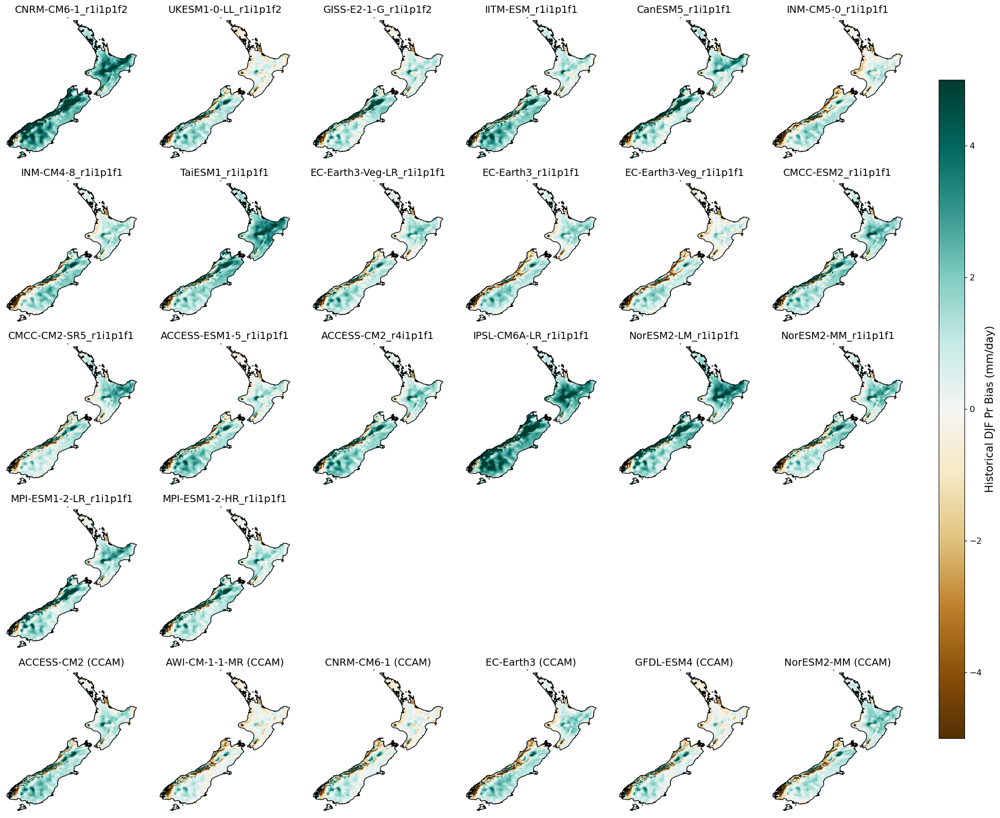

In [172]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Parameters
vmin, vmax = -5, 5
cmap = 'BrBG'

# Get GCM variant names
gcm_emul =list_of_gcms# list(precip_Emul_error['GCM_variant'].values)[:20]  # Ensure max 20
gcm_ccam = list(ann_precip_ccam_error['GCM'].values)[:6]       # Ensure max 6

# Create figure with custom layout: 5 rows × 6 columns
fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(5, 6, figure=fig)

# Plot emulator errors (20)
for i, gcm in enumerate(gcm_emul):
    ax = fig.add_subplot(gs[i // 6, i % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    precip_Emul_error.sel(GCM_variant=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm), fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Plot CCAM errors (6)
for j, gcm in enumerate(gcm_ccam):
    idx = j + 24  # start after 20
    ax = fig.add_subplot(gs[idx // 6, idx % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    cs1 = ann_precip_ccam_error.sel(GCM=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm) + " (CCAM)", fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Add a shared colorbar
cbar_ax = fig.add_axes([0.92, 0.1, 0.025, 0.8])
# Use one plot to get color mapping
#im = precip_Emul_error.sel(GCM_variant=gcm_emul[0]).plot(cmap=cmap, vmin=vmin, vmax=vmax, add_colorbar=False)
cbar = fig.colorbar(cs1, cax=cbar_ax)
cbar.ax.tick_params(labelsize =12)
cbar.set_label('Historical DJF Pr Bias (mm/day)', fontsize =15)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Historical_pattern_of_biases_pr.png', dpi =500, bbox_inches ='tight')

/tmp/ipykernel_188610/536304569.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


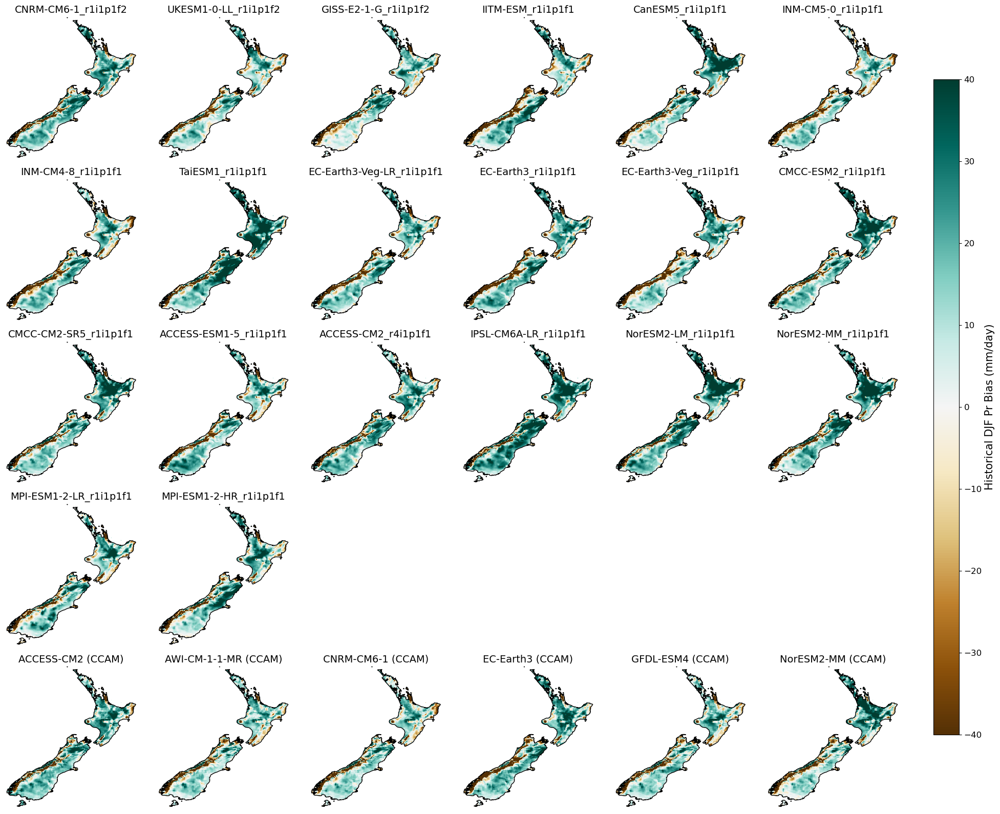

In [175]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Parameters
vmin, vmax = -40, 40
cmap = 'BrBG'

# Get GCM variant names
gcm_emul =list_of_gcms# list(precip_Emul_error['GCM_variant'].values)[:20]  # Ensure max 20
gcm_ccam = list(ann_precip_ccam_error['GCM'].values)[:6]       # Ensure max 6

# Create figure with custom layout: 5 rows × 6 columns
fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(5, 6, figure=fig)

# Plot emulator errors (20)
for i, gcm in enumerate(gcm_emul):
    ax = fig.add_subplot(gs[i // 6, i % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    rx1day_Emul_error.sel(GCM_variant=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm), fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Plot CCAM errors (6)
for j, gcm in enumerate(gcm_ccam):
    idx = j + 24  # start after 20
    ax = fig.add_subplot(gs[idx // 6, idx % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    cs1 = rx1day_ccam_error.sel(GCM=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm) + " (CCAM)", fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Add a shared colorbar
cbar_ax = fig.add_axes([0.92, 0.1, 0.025, 0.8])
# Use one plot to get color mapping
#im = precip_Emul_error.sel(GCM_variant=gcm_emul[0]).plot(cmap=cmap, vmin=vmin, vmax=vmax, add_colorbar=False)
cbar = fig.colorbar(cs1, cax=cbar_ax)
cbar.ax.tick_params(labelsize =12)
cbar.set_label('Historical DJF Pr Bias (mm/day)', fontsize =15)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Historical_pattern_of_biases_rx1day.png', dpi =500, bbox_inches ='tight')

/tmp/ipykernel_188610/2047737502.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


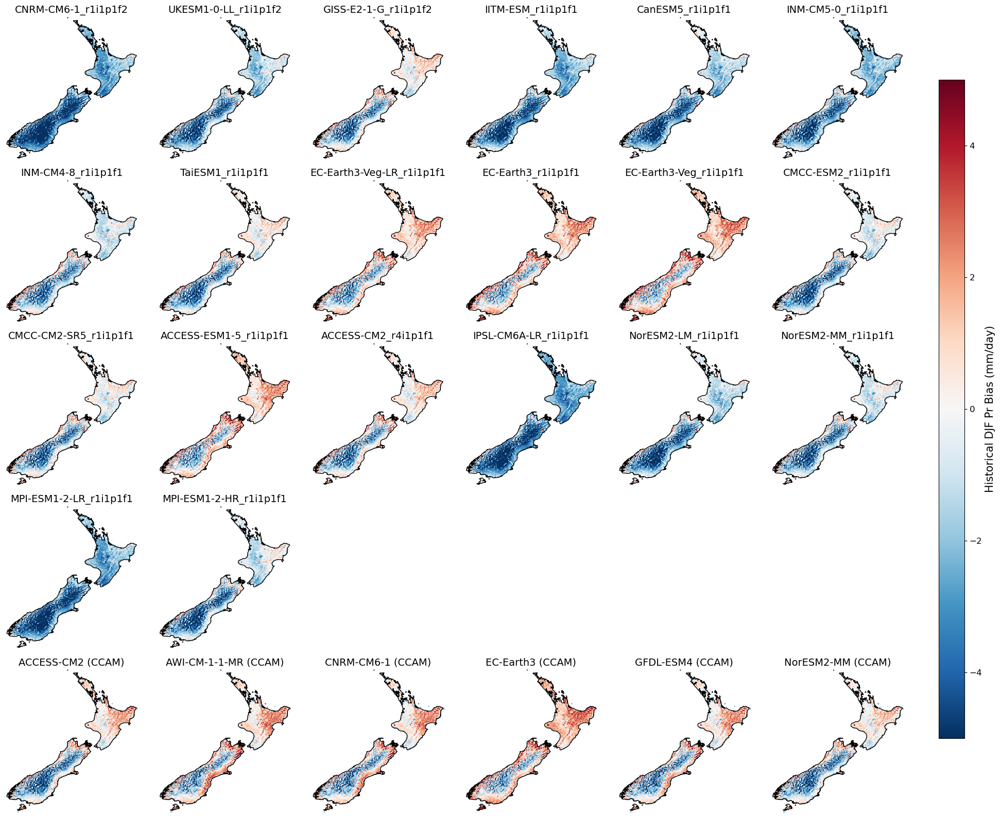

In [186]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Parameters
vmin, vmax = -5, 5
cmap = 'RdBu_r'

# Get GCM variant names
gcm_emul =list_of_gcms# list(precip_Emul_error['GCM_variant'].values)[:20]  # Ensure max 20
gcm_ccam = list(ann_precip_ccam_error['GCM'].values)[:6]       # Ensure max 6

# Create figure with custom layout: 5 rows × 6 columns
fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(5, 6, figure=fig)

# Plot emulator errors (20)
for i, gcm in enumerate(gcm_emul):
    ax = fig.add_subplot(gs[i // 6, i % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    tasmax_Emul_error.sel(GCM_variant=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm), fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Plot CCAM errors (6)
for j, gcm in enumerate(gcm_ccam):
    idx = j + 24  # start after 20
    ax = fig.add_subplot(gs[idx // 6, idx % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    cs1 = ann_tasmax_ccam_error.sel(GCM=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm) + " (CCAM)", fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Add a shared colorbar
cbar_ax = fig.add_axes([0.92, 0.1, 0.025, 0.8])
# Use one plot to get color mapping
#im = precip_Emul_error.sel(GCM_variant=gcm_emul[0]).plot(cmap=cmap, vmin=vmin, vmax=vmax, add_colorbar=False)
cbar = fig.colorbar(cs1, cax=cbar_ax)
cbar.ax.tick_params(labelsize =12)
cbar.set_label('Historical DJF Pr Bias (mm/day)', fontsize =15)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Historical_pattern_of_biases_tasmax.png', dpi =500, bbox_inches ='tight')

/tmp/ipykernel_188610/2357619111.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


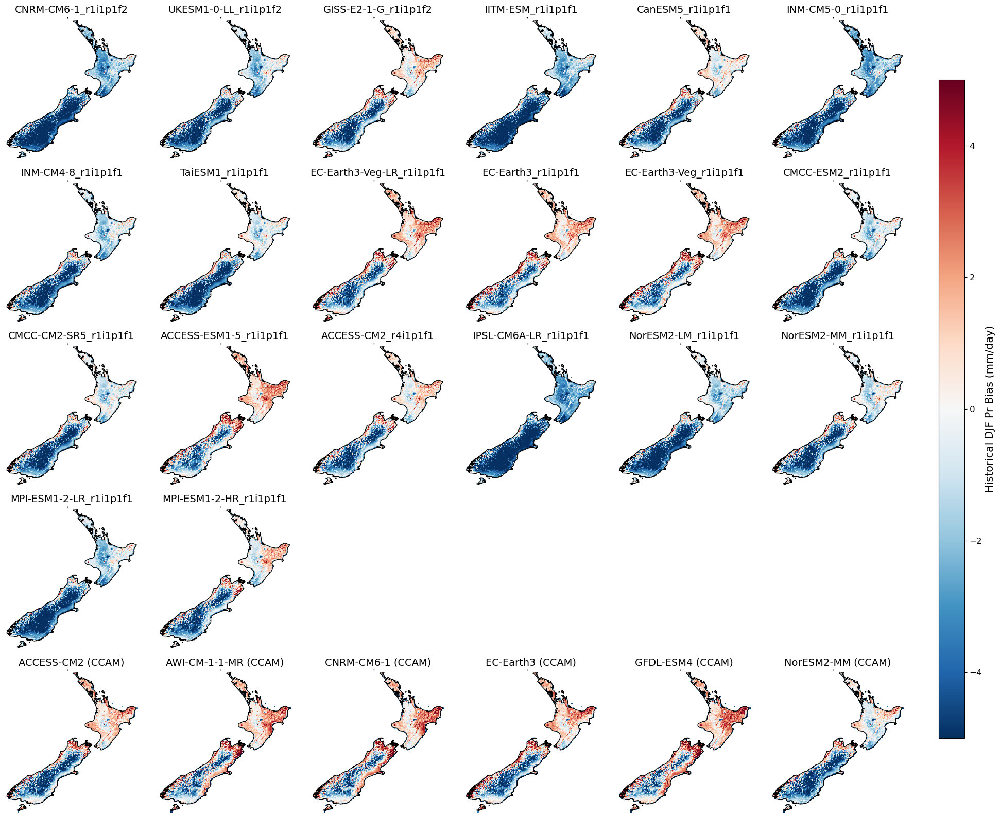

In [187]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Parameters
vmin, vmax = -5, 5
cmap = 'RdBu_r'

# Get GCM variant names
gcm_emul =list_of_gcms# list(precip_Emul_error['GCM_variant'].values)[:20]  # Ensure max 20
gcm_ccam = list(ann_precip_ccam_error['GCM'].values)[:6]       # Ensure max 6

# Create figure with custom layout: 5 rows × 6 columns
fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(5, 6, figure=fig)

# Plot emulator errors (20)
for i, gcm in enumerate(gcm_emul):
    ax = fig.add_subplot(gs[i // 6, i % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    Txx_Emul_error.sel(GCM_variant=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm), fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Plot CCAM errors (6)
for j, gcm in enumerate(gcm_ccam):
    idx = j + 24  # start after 20
    ax = fig.add_subplot(gs[idx // 6, idx % 6], projection = ccrs.PlateCarree(central_longitude =171.77))
    cs1 = txx_ccam_error.sel(GCM=gcm).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, add_colorbar=False, transform = ccrs.PlateCarree())
    ax.set_title(str(gcm) + " (CCAM)", fontsize =14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_frame_on(False)
    ax.coastlines('10m')

# Add a shared colorbar
cbar_ax = fig.add_axes([0.92, 0.1, 0.025, 0.8])
# Use one plot to get color mapping
#im = precip_Emul_error.sel(GCM_variant=gcm_emul[0]).plot(cmap=cmap, vmin=vmin, vmax=vmax, add_colorbar=False)
cbar = fig.colorbar(cs1, cax=cbar_ax)
cbar.ax.tick_params(labelsize =12)
cbar.set_label('Historical DJF Pr Bias (mm/day)', fontsize =15)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Historical_pattern_of_biases_txx.png', dpi =500, bbox_inches ='tight')

In [74]:
biases_inputs = dsets1 - true_climo

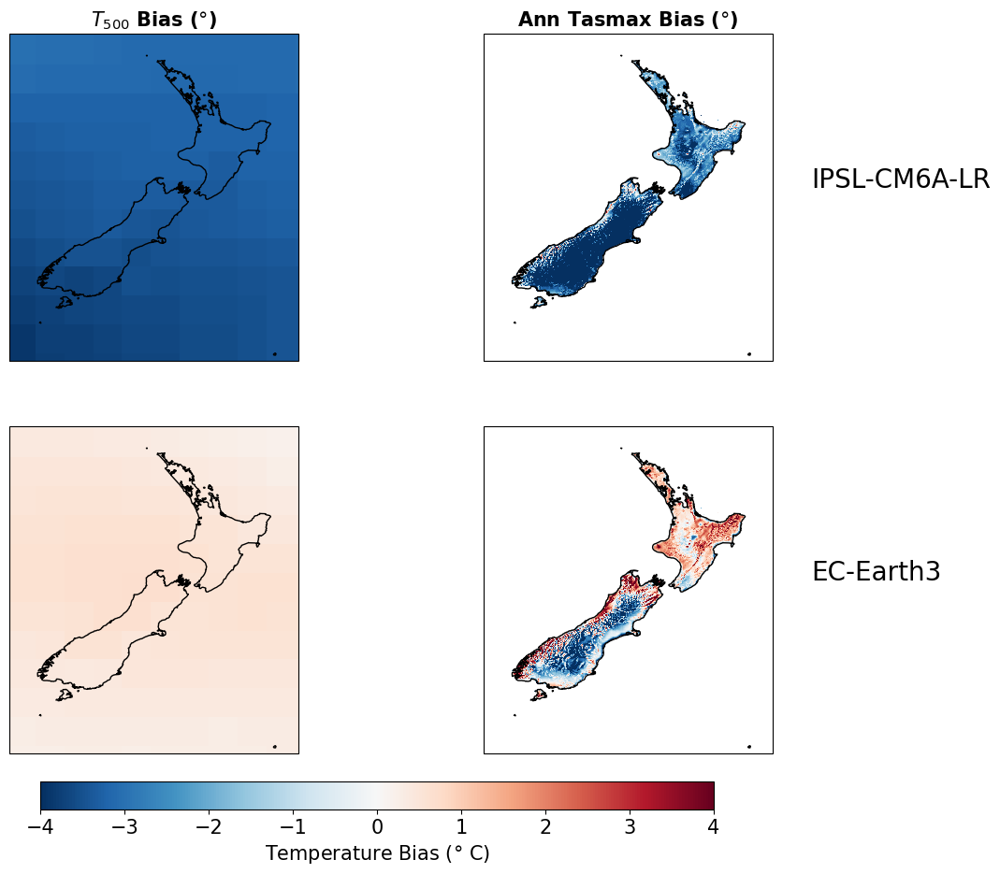

In [144]:
fig, ax = plt.subplots(2, 2, sharex = True, sharey =True, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)), figsize = (12, 10))
biases_inputs.sel(GCM_variant = 'IPSL-CM6A-LR_r1i1p1f1').t_500.isel(season =0).plot(vmax =4, vmin =-4, cmap ='RdBu_r', ax =ax[0,0], transform= ccrs.PlateCarree(), add_colorbar =False)
Txx_Emul_error.sel(GCM_variant = 'IPSL-CM6A-LR_r1i1p1f1').where(mask, np.nan).plot(ax = ax[0,1], transform= ccrs.PlateCarree(), add_colorbar =False, vmax =4, vmin =-4, cmap ='RdBu_r')
ax[0,0].set_extent([165, 180, -33, -50], crs = ccrs.PlateCarree())

#fig, ax = plt.subplots(1, 2, sharex = True, sharey =True, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)))
cs = biases_inputs.sel(GCM_variant = 'EC-Earth3_r1i1p1f1').t_500.isel(season =0).plot(vmax =4, vmin =-4, cmap ='RdBu_r', ax =ax[1,0], transform= ccrs.PlateCarree(), add_colorbar =False)
Txx_Emul_error.sel(GCM_variant = 'EC-Earth3_r1i1p1f1').where(mask, np.nan).plot(ax = ax[1,1], transform= ccrs.PlateCarree(), add_colorbar =False, vmax =4, vmin =-4, cmap ='RdBu_r')
[ax[i, j].coastlines('10m') for i in range(2) for j in range(2)]
[ax[i, j].set_title(' ') for i in range(2) for j in range(2)]
ax[0,0].set_title('$T_{500}$ Bias ($\degree$)', weight ='bold', fontsize =15)
ax[0,1].set_title('Ann Tasmax Bias ($\degree$)', weight ='bold', fontsize =15)
ax[0,1].text(182, -41, 'IPSL-CM6A-LR', fontsize =20, transform = ccrs.PlateCarree())
ax[1,1].text(182, -41, 'EC-Earth3', fontsize =20, transform = ccrs.PlateCarree())
ax4 = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.ax.tick_params(labelsize =15)
cbar.set_label('Temperature Bias ($\degree$ C)', fontsize =15)#ax[0].set_extent([165, 180, -33, -50], crs = ccrs.PlateCarree())
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/visual_illustration_of_biases_historical.png', dpi=500, bbox_inches ='tight')

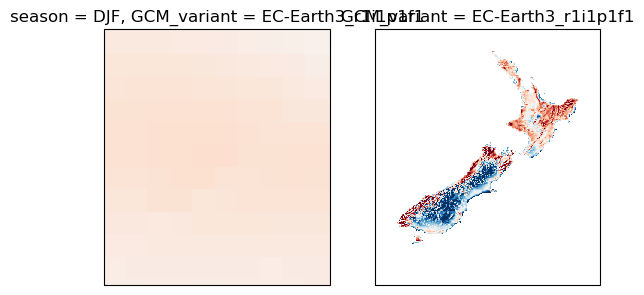

In [ ]:
fig, ax = plt.subplots(1, 2, sharex = True, sharey =True, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)))
biases_inputs.sel(GCM_variant = 'EC-Earth3_r1i1p1f1').u_850.isel(season =0).plot(vmax =4, vmin =-4, cmap ='RdBu_r', ax =ax[0], transform= ccrs.PlateCarree(), add_colorbar =False)
precip_Emul_error.sel(GCM_variant = 'EC-Earth3_r1i1p1f1').where(mask, np.nan).plot(ax = ax[1], transform= ccrs.PlateCarree(), add_colorbar =False, vmax =10, vmin =-10, cmap ='RdBu_r')
ax[0].set_extent([165, 180, -33, -50], crs = ccrs.PlateCarree())

In [21]:
error_climo =np.sqrt(abs( dsets1 - true_climo)**2)#/(true_climo+0.00001)# - dsets1
error_climo_norm = error_climo
list_of_names = list(error_climo_norm.data_vars) 
print(list_of_names)
error_climo_norm_index =xr.concat([error_climo_norm[varname] for varname in list_of_names], dim ="channel")
error_climo_norm_index['channel'] = (('channel'), list_of_names )
normalized = error_climo_norm_index.interp(lat =precip_Emul_error.latitude.values, lon = precip_Emul_error.longitude.values, method ='linear', kwargs = dict(fill_value ='extrapolate')) #.mean(["lat","lon","season"]).to_pandas().sort_values().tail(15)#.plot(kind ="bar")
# Ths index is used for three variables


['u_850', 'u_500', 'v_850', 'v_500', 'q_850', 'q_500', 't_850', 't_500']


In [1702]:
# error_climo_norm_index_precip =np.sqrt(error_climo_norm.q_850**2  )
# normalized_precip = error_climo_norm_index_precip.interp(lat =precip_Emul_error.latitude, lon = precip_Emul_error.longitude, method ='linear', kwargs = dict(fill_value ='extrapolate')) #.mean(["lat","lon","season"]).to_pandas().sort_values().tail(15)#.plot(kind ="bar")
# index_precip = normalized_precip.mean(["latitude","longitude","season"])#.

In [22]:
txx_corrs = xr.corr(abs(Txx_Emul_error.sel(GCM_variant = list_of_gcms).where(mask, np.nan)).mean(["latitude","longitude"]), normalized.mean("season").sel(GCM_variant = list_of_gcms).mean(["lat","lon"]), dim ="GCM_variant")

In [54]:
precip_corrs = xr.corr(abs(precip_Emul_error).where(mask, np.nan).sel(GCM_variant = list_of_gcms).mean(["latitude","longitude"]), normalized.sel(season = season).sel(GCM_variant = list_of_gcms).mean(["lat","lon"]), dim ="GCM_variant")

In [57]:
rx1day_corrs = xr.corr(abs(rx1day_Emul_error).where(mask, np.nan).sel(GCM_variant = list_of_gcms).mean(["latitude","longitude"]), normalized.mean("season").sel(GCM_variant = list_of_gcms).mean(["lat","lon"]), dim ="GCM_variant")

In [104]:
normalized.sel(season = season).sel(GCM_variant = list_of_gcms).rename({"lat":"latitude","lon":"longitude"}).mean(["latitude","longitude"]).sel(channel ='t_500').values.ravel()

array([3.87048082, 0.73705705, 0.47273272, 2.26969906, 0.47769446,
       1.22318875, 0.17926637, 0.27080829, 0.16867384, 0.51738142,
       0.97728841, 0.38219945, 0.48695801, 1.10045067, 0.32782041,
       3.34390393, 0.82150901, 0.23208478, 1.52853571, 0.5525092 ])

In [105]:
list_of_gcms[0]

'CNRM-CM6-1_r1i1p1f2'

In [44]:
tasmax_corrs = xr.corr(abs(tasmax_Emul_error).sel(GCM_variant = list_of_gcms).where(mask, np.nan).mean(["latitude","longitude"]), normalized.sel(season = season).sel(GCM_variant = list_of_gcms).mean(["lat","lon"]), dim ="GCM_variant")

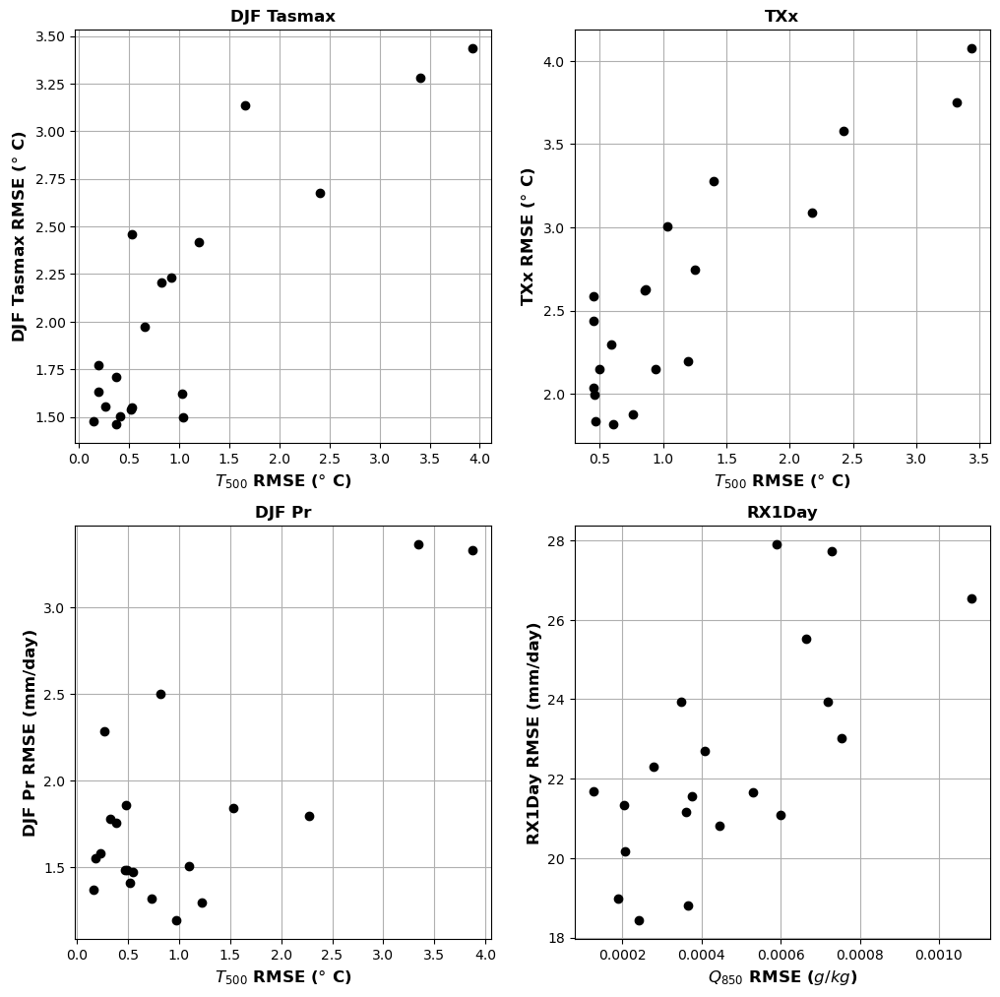

In [70]:
fig, ax = plt.subplots(2,2, figsize = (12, 12))
ax[0,0].plot(normalized.sel(season = season).sel(GCM_variant = list_of_gcms).rename({"lat":"latitude","lon":"longitude"}).where(mask, np.nan).mean(["latitude","longitude"]).sel(channel ='t_500'), abs(tasmax_Emul_error).sel(GCM_variant = list_of_gcms).where(mask, np.nan).mean(["latitude","longitude"]), color ='k', marker ='o', lw =0)
ax[0,1].plot(normalized.mean("season").sel(GCM_variant = list_of_gcms).rename({"lat":"latitude","lon":"longitude"}).where(mask, np.nan).mean(["latitude","longitude"]).sel(channel ='t_500'), abs(Txx_Emul_error).sel(GCM_variant = list_of_gcms).where(mask, np.nan).mean(["latitude","longitude"]) , color ='k', marker ='o', lw =0)
ax[1,0].plot(normalized.sel(season = season).sel(GCM_variant = list_of_gcms).rename({"lat":"latitude","lon":"longitude"}).mean(["latitude","longitude"]).sel(channel ='t_500'), abs(precip_Emul_error).sel(GCM_variant = list_of_gcms).where(mask, np.nan).mean(["latitude","longitude"]), color ='k', marker ='o', lw =0)
ax[1,1].plot(normalized.mean("season").sel(GCM_variant = list_of_gcms).rename({"lat":"latitude","lon":"longitude"}).mean(["latitude","longitude"]).sel(channel ='q_850'), abs(rx1day_Emul_error).sel(GCM_variant = list_of_gcms).where(mask, np.nan).mean(["latitude","longitude"]) , color ='k', marker ='o', lw =0)

ax[0,0].grid('on')
ax[0,1].grid('on')
ax[1,1].grid('on')
ax[1,0].grid('on')
ax[0,0].set_xlabel('$T_{500}$ RMSE ($\degree$ C)', weight ='bold', fontsize =12)
ax[0,1].set_xlabel('$T_{500}$ RMSE ($\degree$ C)', weight ='bold', fontsize =12)
ax[1,0].set_xlabel('$T_{500}$ RMSE ($\degree$ C)', weight ='bold', fontsize =12)
ax[1,1].set_xlabel('$Q_{850}$ RMSE ($g/kg$)', weight ='bold', fontsize =12)

ax[0,0].set_ylabel('DJF Tasmax RMSE ($\degree$ C)', weight ='bold', fontsize =12)
ax[0,1].set_ylabel('TXx RMSE ($\degree$ C)', weight ='bold', fontsize =12)
ax[1,0].set_ylabel('DJF Pr RMSE (mm/day)', weight ='bold', fontsize =12)
ax[1,1].set_ylabel('RX1Day RMSE (mm/day)', weight ='bold', fontsize =12)

ax[0,0].set_title('DJF Tasmax', weight ='bold', fontsize =12)
ax[0,1].set_title('TXx', weight ='bold', fontsize =12)
ax[1,0].set_title('DJF Pr', weight ='bold', fontsize =12)
ax[1,1].set_title('RX1Day', weight ='bold', fontsize =12)
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/biases_in_the_large_scale_fields.png', dpi =500, bbox_inches ='tight')

In [26]:
concat_dset =xr.concat([txx_corrs, precip_corrs, rx1day_corrs, tasmax_corrs], dim ="metric")
concat_dset['metric'] = (('metric'), ['TXx', 'DJF Precip', 'Rx1day', 'DJF Tasmax'])

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np



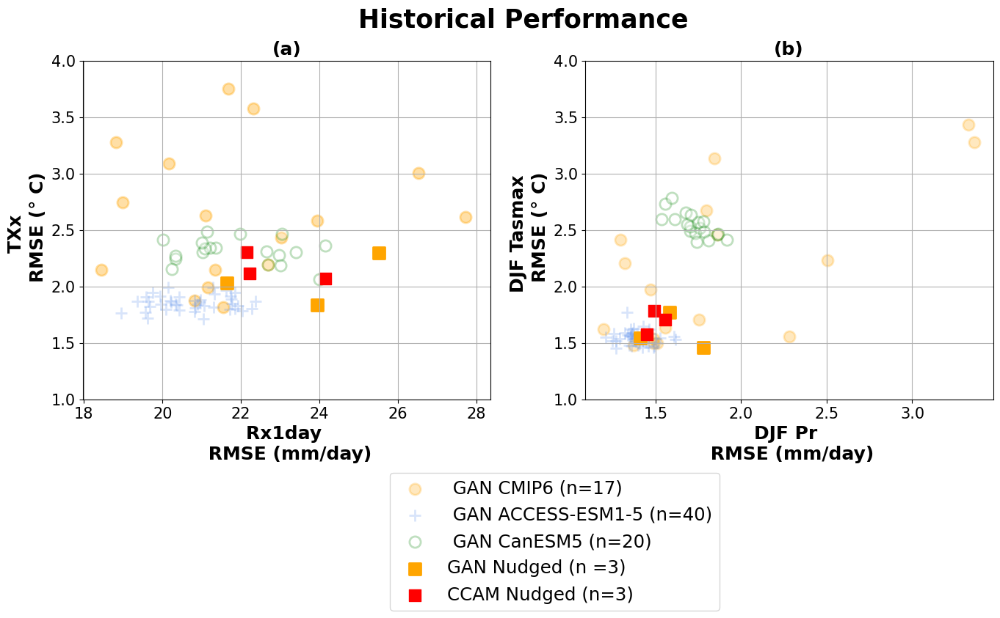

In [41]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
#mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(figsize=(16, 6))
gs = gridspec.GridSpec(2, 4, figure=fig, wspace=0.6, hspace=0.3)

# Create axes
ax00 = fig.add_subplot(gs[:, 0:2])
ax01 = fig.add_subplot(gs[:, 2:4])

#ax02 = fig.add_subplot(gs[:, 4:6])

#fig, ax = plt.subplots(1,2, figsize =(12, 6))

ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(Txx_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]),color= 'orange', lw =2, marker ='o', alpha =0.35, s=120, fc ='orange')
#sns.kdeplot(x=abs(rx1day_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]),
#            y=abs(Txx_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]), ax=ax00, levels=5, color='orange', alpha=0.25)

ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(Txx_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]),ec = 'cornflowerblue', lw =2, marker ='+', alpha =0.25, fc='white', s=120)
#sns.kdeplot(x=abs(rx1day_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]),
#            y=abs(Txx_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]), ax=ax00, levels=5, color='cornflowerblue', alpha=0.25)


ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(Txx_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]),ec = 'green', lw =2, marker ='o', alpha =0.25, fc ='white', s=120)

ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']), 
        abs(Txx_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']),
ec = 'orange', lw =2, marker ='s', fc ='orange', s=130)


# ax[0].plot(abs(perfect_model_rx1day_error).where(mask, np.nan).mean(["latitude","longitude"]), 
#         abs(perfect_model_txx_error.sel(GCM = perfect_model_rx1day_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]),'gs')

ax00.scatter(abs(rx1day_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']), 
        abs(txx_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']),marker ='s', ec ='r', s=130, fc ='r')


# ax00.scatter(abs(rx1day_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]), 
#         abs(txx_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]),marker ='o', ec ='r', s=120, fc ='r')



ax00.set_ylabel('TXx \n RMSE ($\degree$ C)', weight ='bold', fontsize =18)
ax00.set_xlabel('Rx1day \n RMSE (mm/day)', weight ='bold', fontsize =18)

ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(tasmax_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]),marker ='o', ec ='orange', s=120, fc ='orange', alpha =0.25, lw =2,
             label =' GAN CMIP6 (n=17)')


ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(tasmax_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]),ec = 'cornflowerblue', lw =2, marker ='+', alpha =0.25, fc ='white', s=120, 
             label =' GAN ACCESS-ESM1-5 (n=40)')



ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(tasmax_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]),
             ec = 'green', lw =2, marker ='o', alpha =0.25, s=120, fc ='white', label =' GAN CanESM5 (n=20)')


ax01.grid('on')
ax00.grid('on')

ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']), 
        abs(tasmax_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']),
ec = 'orange', lw =2, marker ='s', fc ='orange', s=120, label = 'GAN Nudged (n =3)')

ax01.scatter(abs(ann_precip_ccam_error).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']), 
        abs(ann_tasmax_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']),
             marker ='s', ec ='r', s=130, fc ='r', label ='CCAM Nudged (n=3)')

# ax01.scatter(abs(ann_precip_ccam_error).where(mask, np.nan).mean(["latitude","longitude"]), 
#         abs(ann_tasmax_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]),marker ='o', ec ='r', s=120, fc ='r')
ax01.legend(loc = "lower left", bbox_to_anchor = (-0.5, -0.65), fontsize =17.6)

ax01.set_ylabel('DJF Tasmax \n RMSE ($\degree$ C)', weight ='bold', fontsize =18)
ax01.set_xlabel('DJF Pr \n RMSE (mm/day)', weight ='bold', fontsize =18)

# 
ax01.set_title('(b)', weight='bold', fontsize=18)
ax00.set_title('(a)', weight='bold', fontsize=18)
ax00.tick_params(labelsize=15)
ax01.tick_params(labelsize=15)
ax01.set_ylim(1.0, 4)
ax00.set_ylim(1.0, 4)
fig.suptitle('Historical Performance', fontsize =25, weight ='bold', x=0.5, y =1.002)
     
plt.subplots_adjust(wspace=0.23, hspace=0.15)
plt.show()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_skill_figure1_bsherwood.png', dpi =500, bbox_inches ='tight')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_skill_figure1_bsherwood.pdf', dpi =500, bbox_inches ='tight')

In [26]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import matplotlib as mpl

# # Re-enable inline plotting (for Jupyter)
# %matplotlib inline

# # Reset matplotlib style to default
# mpl.rcParams.update(mpl.rcParamsDefault)

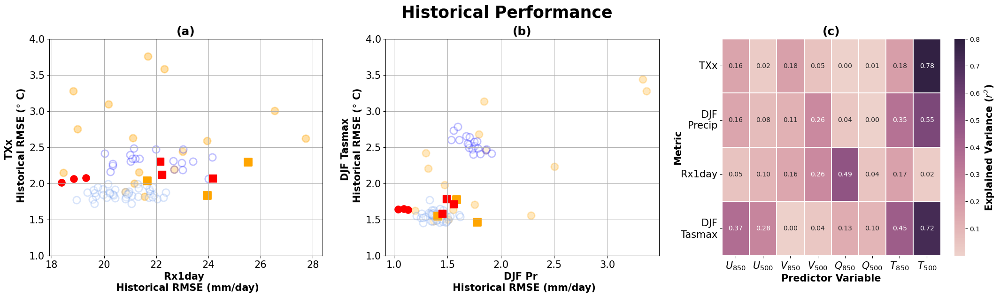

In [27]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
#mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(figsize=(26, 6))
gs = gridspec.GridSpec(2, 6, figure=fig, wspace=0.6, hspace=0.3)

# Create axes
ax00 = fig.add_subplot(gs[:, 0:2])
ax01 = fig.add_subplot(gs[:, 2:4])

ax02 = fig.add_subplot(gs[:, 4:6])

#fig, ax = plt.subplots(1,2, figsize =(12, 6))

ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(Txx_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]),color= 'orange', lw =2, marker ='o', alpha =0.35, s=120, fc ='orange')
#sns.kdeplot(x=abs(rx1day_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]),
#            y=abs(Txx_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]), ax=ax00, levels=5, color='orange', alpha=0.25)

ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(Txx_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]),ec = 'cornflowerblue', lw =2, marker ='o', alpha =0.25, fc='white', s=120)
#sns.kdeplot(x=abs(rx1day_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]),
#            y=abs(Txx_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]), ax=ax00, levels=5, color='cornflowerblue', alpha=0.25)


ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(Txx_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]),ec = 'blue', lw =2, marker ='o', alpha =0.25, fc ='white', s=120)

ax00.scatter(abs(rx1day_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']), 
        abs(Txx_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']),
ec = 'orange', lw =2, marker ='s', fc ='orange', s=130)


# ax[0].plot(abs(perfect_model_rx1day_error).where(mask, np.nan).mean(["latitude","longitude"]), 
#         abs(perfect_model_txx_error.sel(GCM = perfect_model_rx1day_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]),'gs')

ax00.scatter(abs(rx1day_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']), 
        abs(txx_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']),marker ='s', ec ='r', s=130, fc ='r')


ax00.scatter(abs(rx1day_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(txx_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]),marker ='o', ec ='r', s=120, fc ='r')



ax00.set_ylabel('TXx \n Historical RMSE ($\degree$ C)', weight ='bold', fontsize =15)
ax00.set_xlabel('Rx1day \n Historical RMSE (mm/day)', weight ='bold', fontsize =15)

ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(tasmax_Emul_error.sel(GCM_variant = list_of_gcms)).where(mask, np.nan).mean(["latitude","longitude"]),marker ='o', ec ='orange', s=120, fc ='orange', alpha =0.25, lw =2)


ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(tasmax_Emul_error.sel(GCM_variant = accessesm1)).where(mask, np.nan).mean(["latitude","longitude"]),ec = 'cornflowerblue', lw =2, marker ='o', alpha =0.25, fc ='white', s=120)



ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(tasmax_Emul_error.sel(GCM_variant = canesm)).where(mask, np.nan).mean(["latitude","longitude"]),ec = 'blue', lw =2, marker ='o', alpha =0.25, s=120, fc ='white')


ax01.grid('on')
ax00.grid('on')

ax01.scatter(abs(precip_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']), 
        abs(tasmax_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']),
ec = 'orange', lw =2, marker ='s', fc ='orange', s=120)

ax01.scatter(abs(ann_precip_ccam_error).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']), 
        abs(ann_tasmax_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM = ['ACCESS-CM2', 'EC-Earth3','NorESM2-MM']),marker ='s', ec ='r', s=130, fc ='r')

ax01.scatter(abs(ann_precip_ccam_error).where(mask, np.nan).mean(["latitude","longitude"]), 
        abs(ann_tasmax_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).mean(["latitude","longitude"]),marker ='o', ec ='r', s=120, fc ='r')


ax01.set_ylabel('DJF Tasmax \n Historical RMSE ($\degree$ C)', weight ='bold', fontsize =15)
ax01.set_xlabel('DJF Pr \n Historical RMSE (mm/day)', weight ='bold', fontsize =15)

# Convert to pandas and square values
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

df = (concat_dset.to_pandas())**2

# Annotate only values > 0.45, bold those annotations
annot = df.applymap(lambda x: f"**{x:.2f}**" if x > 0.45 else f"{x:.2f}")

# Plot
cs = sns.heatmap(
    df,
    cmap=sns.cubehelix_palette(as_cmap=True),
    vmax=0.8,
    annot=True,
    fmt=".2f",
    cbar=True,
    linewidth=0.25,
    ax=ax02
)

# Set cbar label
colorbar = cs.collections[0].colorbar
colorbar.set_label('Explained Variance ($r^2$)', fontsize=15, weight='bold')

# Tick labels
labels = ['U_{850}', 'U_{500}', 'V_{850}', 'V_{500}', 'Q_{850}', 'Q_{500}', 'T_{850}', 'T_{500}']
ax02.set_xticklabels([f"${label}$" for label in labels], fontsize=15, weight='bold')
ax02.set_xlabel('Predictor Variable', weight='bold', fontsize=15)

ax02.set_yticklabels(
    ['TXx', '   DJF\nPrecip', 'Rx1day', '$\hspace{-0.1}$DJF\nTasmax'],
    fontsize=15,
    rotation=0,
    va='center'
)

# Add center-aligned y-axis label
ax02.set_ylabel('Metric', fontsize=15, weight='bold', labelpad=30)
ax02.yaxis.set_label_coords(-0.18, 0.5)  # Adjust as needed

# Final formatting
ax02.set_title('(c)', weight='bold', fontsize=18)
ax01.set_title('(b)', weight='bold', fontsize=18)
ax00.set_title('(a)', weight='bold', fontsize=18)
ax00.tick_params(labelsize=15)
ax01.tick_params(labelsize=15)
ax01.set_ylim(1.0, 4)
ax00.set_ylim(1.0, 4)
fig.suptitle('Historical Performance', fontsize =25, weight ='bold', x=0.5, y =1.002)
     
plt.subplots_adjust(wspace=0.23, hspace=0.15)
plt.show()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_skill_figure1.png', dpi =500, bbox_inches ='tight')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_skill_figure1.pdf', dpi =500, bbox_inches ='tight')

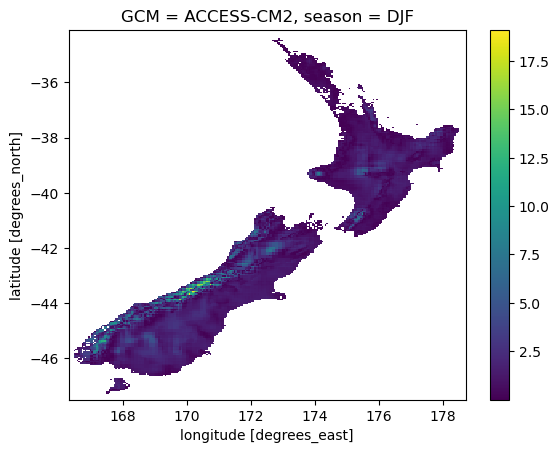

In [230]:
ann_precip_ccam_error.isel(GCM =0).plot()
plt.show()

In [226]:
abs(ann_precip_ccam_error)#.where(mask, np.nan).mean(["latitude","longitude"])

<xarray.DataArray (GCM: 6, latitude: 268, longitude: 248)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * GCM        (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
    season     <U3 'DJF'
    lat        (latitude) float64 -47.47 -47.42 -47.37 ... -34.22 -34.17 -34.12
    lon        (longitude) float64 166.3 166.4 166.4 166.5 ... 178.6 178.6 178.7
  * latitude   (latitude) float64 -47.47 -47.42 -47.37 ... -34.22 -34.17 -34.12
  * longitude  (longitude) float64 166.3 166.4 166.4 166.5 ... 178.6 178.6 178.7

In [120]:
abs(ann_tasmax_ccam_error.sel(GCM = ann_precip_ccam_error.GCM.values)).where(mask, np.nan).sel(season = season).mean(["latitude","longitude"])

<xarray.DataArray (GCM: 6)>
array([1.70805968, 1.63915391, 1.64707183, 1.7824629 , 1.63328362,
       1.57912737])
Coordinates:
  * GCM      (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
    season   <U3 'DJF'

In [117]:
abs(tasmax_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).sel(season = season).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1'])

<xarray.DataArray (GCM_variant: 3)>
array([1.46162101, 1.54813047, 1.77381583])
Coordinates:
  * GCM_variant  (GCM_variant) <U25 'ACCESS-CM2_r4i1p1f1' ... 'NorESM2-MM_r1i...
    season       <U3 'DJF'

In [116]:
abs(precip_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).sel(season = season).where(mask, np.nan).mean(["latitude","longitude"]).sel(GCM_variant = ['ACCESS-CM2_r4i1p1f1', 'EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1'])

<xarray.DataArray (GCM_variant: 3)>
array([51.81014969, 39.09666118, 44.85649876])
Coordinates:
  * GCM_variant  (GCM_variant) <U25 'ACCESS-CM2_r4i1p1f1' ... 'NorESM2-MM_r1i...
    season       <U3 'DJF'

In [115]:
abs(tasmax_Emul_error.sel(GCM_variant = precip_Emul_error.GCM_variant.values)).sel(season = season).where(mask, np.nan).mean(["latitude","longitude"])

<xarray.DataArray (GCM_variant: 77)>
array([2.46098702, 2.59972153, 2.78291521, 1.770237  , 1.51044376,
       1.54367248, 2.46986392, 2.4851109 , 1.55545815, 2.73188358,
       2.67553859, 2.57293623, 2.41685023, 3.13635801, 1.58436513,
       2.47289061, 1.62660206, 1.5689407 , 1.63303587, 1.46099487,
       1.62431434, 2.63849628, 1.54343107, 1.5885892 , 1.57277714,
       1.47790708, 1.53544022, 3.43529966, 1.56790855, 1.47276186,
       2.20577136, 2.57808647, 3.27826462, 2.6530826 , 1.64616376,
       2.53306351, 1.4813939 , 2.516515  , 1.55918438, 1.50073983,
       1.47931231, 2.49035316, 2.60003061, 1.77381583, 1.70790124,
       1.58293168, 1.56532272, 2.39696181, 1.62360885, 2.54945717,
       1.51975956, 1.58162945, 1.97445935, 1.55489957, 2.23371895,
       1.45145501, 2.40650923, 1.54813047, 1.53705634, 1.58498716,
       1.53621096, 1.5883925 , 1.53481808, 1.55190532, 1.49874682,
       1.62312805, 1.5568034 , 1.52196755, 1.47343913, 1.45870543,
       1.53528152, 1.46162101, 1.47166007, 1.49394519, 1.50458844,
       2.41282839, 1.53884051])
Coordinates:
  * GCM_variant  (GCM_variant) <U25 'CanESM5_r1i1p1f1' ... 'CMCC-CM2-SR5_r1i1...
    season       <U3 'DJF'

In [113]:
ann_precip_ccam_error

<xarray.DataArray (GCM: 6, season: 4, latitude: 268, longitude: 248)>
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]])
Coordinates:
  * GCM        (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
    lat        (latitude) float64 -47.47 -47.42 -47.37 ... -34.22 -34.17 -34.12
    lon        (longitude) float64 166.3 166.4 166.4 166.5 ... 178.6 178.6 178.7
  * latitude   (latitude) float64 -47.47 -47.42 -47.37 ... -34.22 -34.17 -34.12
  * longitude  (longitude) float64 166.3 166.4 166.4 166.5 ... 178.6 178.6 178.7

# Plot showing corrlations across all variables

# Indivudal Bar plots for each variable

In [1591]:
abs(error_climo).sel(GCM_variant = accessesm1).mean(["latitude","longitude","season","GCM_variant"])

ValueError: Dataset does not contain the dimensions: ['latitude', 'longitude']

In [1579]:
error_climo.sel(GCM_variant = canesm).mean(["season","GCM_variant"]).t_850.plot()

In [1592]:
error_climo.sel(GCM_variant = accessesm1).mean(["season","GCM_variant"]).t_850.plot()

In [996]:
tasmax_Emul_error.GCM_variant.to_index().sort_values()

Index(['ACCESS-CM2_r4i1p1f1', 'ACCESS-ESM1-5_r10i1p1f1',
       'ACCESS-ESM1-5_r11i1p1f1', 'ACCESS-ESM1-5_r12i1p1f1',
       'ACCESS-ESM1-5_r13i1p1f1', 'ACCESS-ESM1-5_r14i1p1f1',
       'ACCESS-ESM1-5_r15i1p1f1', 'ACCESS-ESM1-5_r16i1p1f1',
       'ACCESS-ESM1-5_r17i1p1f1', 'ACCESS-ESM1-5_r18i1p1f1',
       'ACCESS-ESM1-5_r19i1p1f1', 'ACCESS-ESM1-5_r1i1p1f1',
       'ACCESS-ESM1-5_r20i1p1f1', 'ACCESS-ESM1-5_r21i1p1f1',
       'ACCESS-ESM1-5_r22i1p1f1', 'ACCESS-ESM1-5_r23i1p1f1',
       'ACCESS-ESM1-5_r24i1p1f1', 'ACCESS-ESM1-5_r25i1p1f1',
       'ACCESS-ESM1-5_r26i1p1f1', 'ACCESS-ESM1-5_r27i1p1f1',
       'ACCESS-ESM1-5_r28i1p1f1', 'ACCESS-ESM1-5_r29i1p1f1',
       'ACCESS-ESM1-5_r2i1p1f1', 'ACCESS-ESM1-5_r30i1p1f1',
       'ACCESS-ESM1-5_r31i1p1f1', 'ACCESS-ESM1-5_r32i1p1f1',
       'ACCESS-ESM1-5_r33i1p1f1', 'ACCESS-ESM1-5_r34i1p1f1',
       'ACCESS-ESM1-5_r35i1p1f1', 'ACCESS-ESM1-5_r36i1p1f1',
       'ACCESS-ESM1-5_r37i1p1f1', 'ACCESS-ESM1-5_r38i1p1f1',
       'ACCESS-ESM1-5_r39i1p1f

In [387]:
ccam_historical = ccam_historical.interp(lat = precip_ensemble.latitude, lon = precip_ensemble.longitude,
                                         method ='nearest', kwargs = dict(fill_value ='extrapolate'))

In [527]:
climo_true_pr = observations.sel(time = slice("1986","2005")).groupby('time.season').mean()
climo_true_pr = climo_true_pr.interp(latitude = precip_ensemble.latitude, longitude = precip_ensemble.longitude, method ='nearest', kwargs = dict(fill_value ='extrapolate'))


In [526]:
climo_true_tasmax = tasmax_obs.sel(time = slice("1986","2005")).groupby('time.season').mean()
climo_true_tasmax = climo_true_tasmax .interp(latitude = precip_ensemble.latitude, longitude = precip_ensemble.longitude, method ='nearest', kwargs = dict(fill_value ='extrapolate'))


In [401]:
climo_true.rain_council

<xarray.DataArray 'rain_council' (latitude: 260, longitude: 243)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])
Coordinates:
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5

In [532]:
error_em_pr =  (precip_ensemble.PR -climo_true_pr .rain_council.sel(season = season))

In [533]:
error_em_tasmax =  (tasmax.TX -climo_true_tasmax.tmax.sel(season = season))

In [740]:
error_perfect_em = (perfect_model_climo.sel(season = season) - climo_true_pr .rain_council.sel(season = season) ).sel(GCM =['ACCESS-CM2','EC-Earth3','NorESM2-MM'])#/climo_true.rain_council

In [784]:
error_perfect_em

<xarray.DataArray (GCM: 3, latitude: 260, longitude: 243)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * GCM        (GCM) object 'ACCESS-CM2' 'EC-Earth3' 'NorESM2-MM'
    season     <U3 'JJA'
    lat        (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
    lon        (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5

In [535]:
error_perfect_em_tasmax = (perfect_model_climo_tasmax.sel(season = season) - climo_true_tasmax .tmax.sel(season = season) ).sel(GCM =['ACCESS-CM2','EC-Earth3','NorESM2-MM'])#/climo_true.rain_council

In [738]:
error_ccam = (ccam_historical.seasonal_pr_hist.sel(season = season)*86400 - climo_true_pr .rain_council.sel(season = season) )#/climo_true.rain_council

In [560]:
error_ccam_tasmax = (ccam_historical.seasonal_tasmax_hist.sel(season = season) - climo_true_tasmax .tmax.sel(season = season))#/climo_true.rain_council

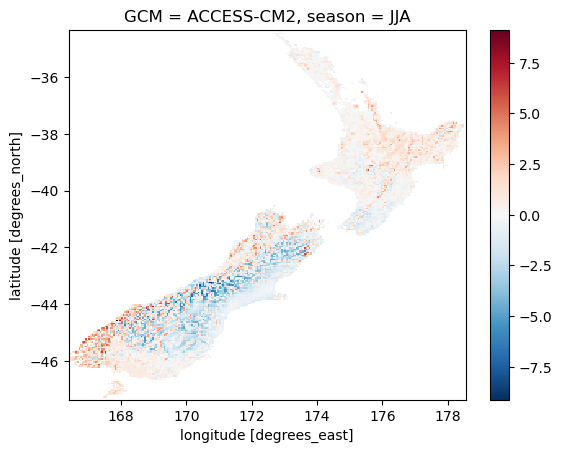

In [562]:
error_ccam_tasmax.isel(GCM =0).plot()

# Loaded the CCAM and AI ensembles for error comparison

# Obtaining ERA5 data to highlight that circulation erros are the main cause of GCM errors?

In [1373]:
era5_data = xr.open_dataset(r"/nesi/project/niwa00018/ML_downscaling_CCAM/Training_CNN/inputs/ERA5/ERA5_training_dataset_5_3_24_remapcon.nc")

In [1377]:
era5_data_v2 = era5_data.copy()

In [1385]:
era5_data_v2['t_500'].data = era5_data_v2['t_500'].values[:,::-1,:]

In [1386]:
era5_data_v2

<xarray.Dataset>
Dimensions:    (time: 17167, bnds: 2, lon: 26, lat: 23)
Coordinates:
  * time       (time) datetime64[ns] 1974-01-01T09:00:00 ... 2020-12-31T09:00:00
  * lon        (lon) float64 150.6 152.1 153.6 155.1 ... 183.6 185.1 186.6 188.1
  * lat        (lat) float64 -59.38 -57.88 -56.38 ... -29.38 -27.88 -26.38
Dimensions without coordinates: bnds
Data variables: (12/16)
    time_bnds  (time, bnds) datetime64[ns] 1974-01-01 ... 2020-12-31T18:00:00
    q_250      (time, lat, lon) float32 ...
    q_500      (time, lat, lon) float32 ...
    q_850      (time, lat, lon) float32 ...
    u_250      (time, lat, lon) float32 ...
    u_500      (time, lat, lon) float32 ...
    ...         ...
    w_250      (time, lat, lon) float32 ...
    w_500      (time, lat, lon) float32 ...
    w_850      (time, lat, lon) float32 ...
    t_250      (time, lat, lon) float32 ...
    t_850      (time, lat, lon) float32 ...
    t_500      (time, lat, lon) float32 248.3 249.5 250.4 ... 263.0 263.1 263.3
Attributes: (12/49)
    CDI:                    Climate Data Interface version 1.9.5 (http://mpim...
    history:                Tue Mar 05 19:53:26 2024: cdo -L remapcon,target_...
    source:                 ACCESS-CM2 (2019): \naerosol: UKCA-GLOMAP-mode\na...
    institution:            CSIRO (Commonwealth Scientific and Industrial Res...
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    ...                     ...
    variant_label:          r4i1p1f1
    version:                v20210607
    license:                CMIP6 model data produced by CSIRO is licensed un...
    cmor_version:           3.4.0
    tracking_id:            hdl:21.14100/f3a0b188-132f-4400-bf3f-dbf73c01b3fb
    CDO:                    Climate Data Operators version 1.9.5 (http://mpim...

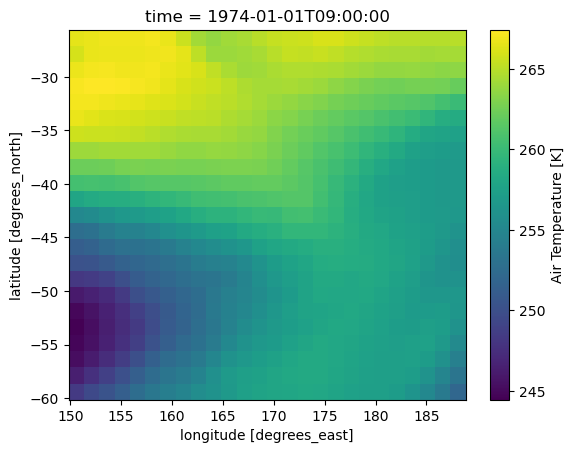

In [1388]:
era5_data_v2.t_500[:,:].isel(time =0).plot()

In [29]:
gcm_data = xr.open_dataset(r'/nesi/project/niwa03712/CMIP6_data/Downscaled_Preprocessed/CMIP/CSIRO-ARCCSS/ACCESS-CM2/historical/r4i1p1f1/day/CMIP_CSIRO-ARCCSS_ACCESS-CM2_historical_r4i1p1f1_day_gn_v20210607.nc')

In [1001]:
error_climo

<xarray.Dataset>
Dimensions:      (plev: 2, season: 4, GCM_variant: 79, latitude: 260, longitude: 243)
Coordinates:
  * plev         (plev) int32 85000 50000
  * season       (season) object 'DJF' 'JJA' 'MAM' 'SON'
  * GCM_variant  (GCM_variant) <U25 'CNRM-CM6-1_r1i1p1f2' ... 'MPI-ESM1-2-HR_...
    lat          (latitude) float64 -34.38 -34.42 -34.47 ... -47.28 -47.33
    lon          (longitude) float64 166.4 166.5 166.5 ... 178.4 178.5 178.5
  * latitude     (latitude) float64 -34.38 -34.42 -34.47 ... -47.28 -47.33
  * longitude    (longitude) float64 166.4 166.5 166.5 ... 178.4 178.5 178.5
Data variables:
    u_850        (GCM_variant, season, latitude, longitude) float64 2.143 ......
    u_500        (GCM_variant, season, latitude, longitude) float64 1.792 ......
    v_850        (GCM_variant, season, latitude, longitude) float64 -0.3078 ....
    v_500        (GCM_variant, season, latitude, longitude) float64 -0.3102 ....
    q_850        (GCM_variant, season, latitude, longitude) float64 -7.677e-0...
    q_500        (GCM_variant, season, latitude, longitude) float64 8.373e-05...
    t_850        (GCM_variant, season, latitude, longitude) float64 -1.015 .....
    t_500        (GCM_variant, season, latitude, longitude) float64 4.785 ......

In [625]:
ccam_biases = xr.open_dataset(r"/nesi/project/niwa00018/ML_downscaling_CCAM/multi-variate-gan/inputs/predictor_fields/predictor_fields_hist_ssp370_merged_updated.nc")

In [627]:
ccam_biases_climo = ccam_biases.sel(time = slice("1986","2005")).groupby('time.season').mean()

In [631]:
ccam_biases_climo = ccam_biases_climo  - true_climo

In [669]:
error_climo =error_climo.interp(lat = precip_ensemble.latitude, lon = precip_ensemble.longitude, method ='cubic', kwargs = dict(fill_value ='extrapolate'))

In [670]:
common = error_climo.GCM_variant.to_index().intersection(precip_ensemble.GCM_variant.to_index())

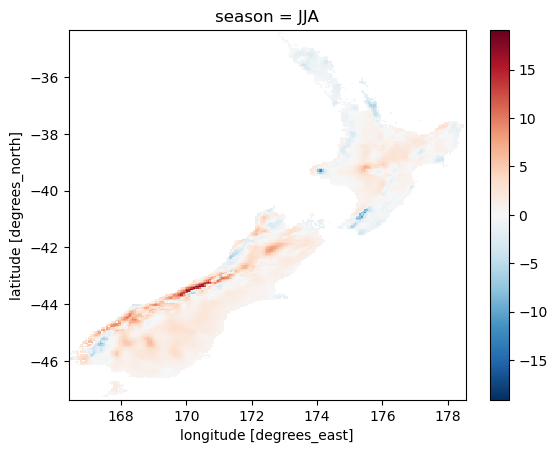

In [539]:
error_em_pr.mean("GCM_variant").plot()

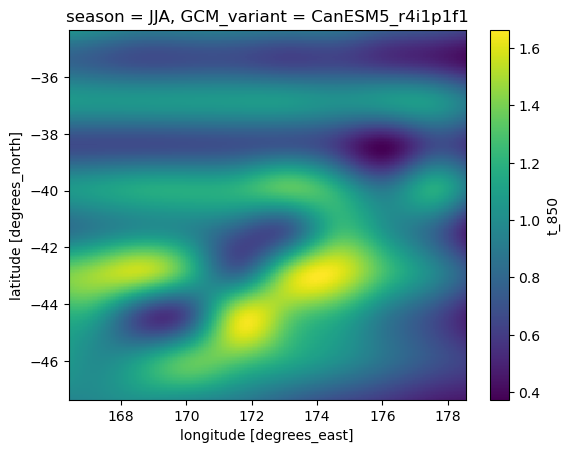

In [540]:
(abs(error_climo.t_850.sel(season = season))).isel(GCM_variant =9
                                                  ).plot()

In [680]:
corrs = xr.corr((abs(error_climo.t_850.sel(season = season))).sel(GCM_variant = list_of_gcms), (abs(error_em_pr.sel(GCM_variant =list_of_gcms) )), dim ="GCM_variant")

In [672]:
corrs = xr.corr((abs(error_climo.t_850.sel(season = season))).sel(GCM_variant = list_of_gcms), (abs(error_em_tasmax.sel(GCM_variant =list_of_gcms) )), dim ="GCM_variant")

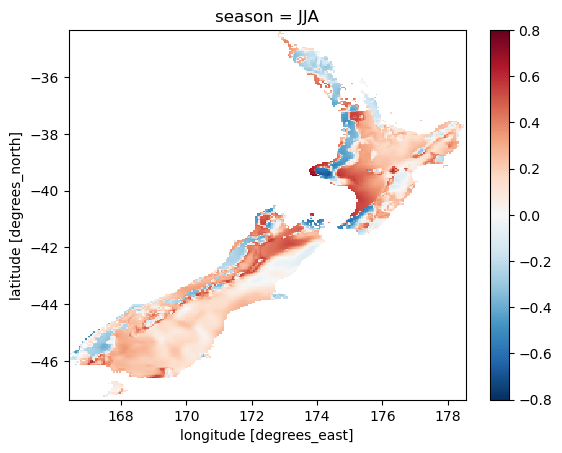

In [681]:
(corrs).plot(vmin =-0.8, cmap ='RdBu_r', vmax =0.8)

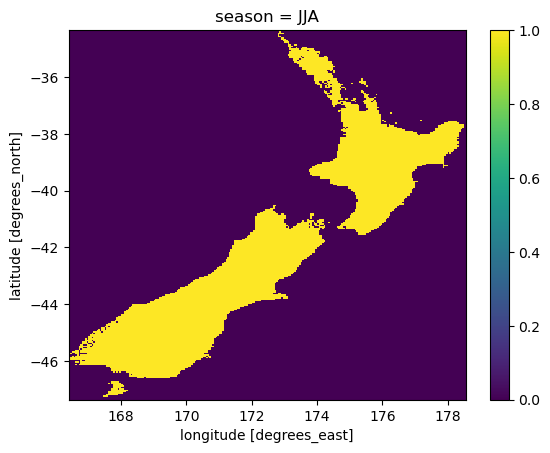

In [646]:
(~corrs.isnull()).plot()

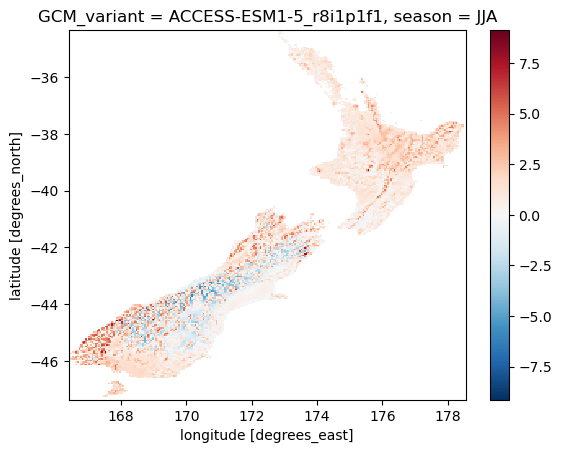

In [556]:
error_em_tasmax.isel(GCM_variant =5).plot()

In [694]:
common1 = common

In [695]:
common2 = list_of_gcms

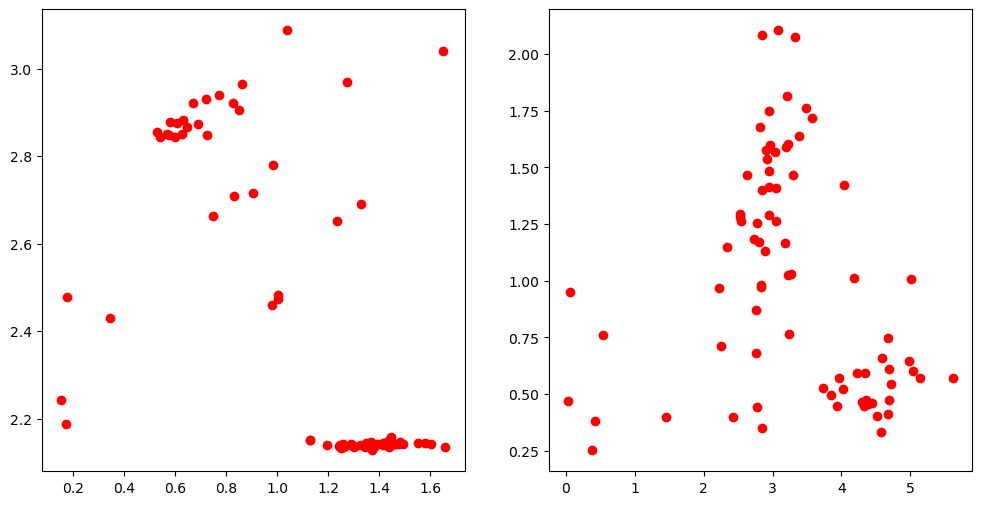

In [702]:
fig, ax = plt.subplots(1,2, figsize = (12,6))
lat = -44.5
lon =168.9
#42.7157° S, 170.9683° E
# Look at some regions, check correlation at the Mt Cook. 
# Q_850
# v_850
#T_850.

# Shade the large ensemble

# Three AI nudged vs CCAM


#ax.plot((abs(error_climo.t_850.sel(season = season))).interp(latitude = lat, longitude = lon).sel(GCM_variant = list_of_gcms).values,(abs(error_em_tasmax)).interp(latitude = lat, longitude = lon).sel(GCM_variant = list_of_gcms).values,'ro')
ax[0].plot((abs(error_climo.t_850.sel(season = season))).where((~corrs.isnull()), np.nan).interp(latitude = lat, longitude = lon).sel(GCM_variant =common).values,(abs(error_em_tasmax)).interp(latitude = lat, longitude = lon).sel(GCM_variant =common).values,'ro')
ax[1].plot((abs(error_climo.u_850.sel(season = season))).where((~corrs.isnull()), np.nan).interp(latitude = lat, longitude = lon).sel(GCM_variant =common).values,(abs(error_em_pr)).interp(latitude = lat, longitude = lon).sel(GCM_variant =common).values,'ro')

In [ ]:
# MAPE error

In [143]:
error_em.mean(["latitude","longitude"])

<xarray.DataArray (GCM_variant: 70)>
array([30.15970861, 34.50466169, 31.29000335, 33.96584722, 29.31421386,
       34.26496775, 31.83537624, 35.20504407, 88.12479436, 31.36837557,
       40.3338045 , 31.54759413, 32.2466544 , 53.61140974, 38.22960583,
       32.59029901, 35.04934704, 30.07380624, 29.84894272, 31.4270618 ,
       29.3668826 , 28.55858526, 32.97955656, 32.52244659, 35.44885073,
       32.43198738, 31.22171376, 31.77002282, 28.83166865, 34.94104197,
       35.38869665, 34.56018419, 34.18541553, 31.14289534, 31.32129726,
       35.06132154, 34.52950549, 35.76335248, 31.95359574, 39.58807315,
       34.02853909, 35.14734597, 32.81570802, 32.5698115 , 31.65485166,
       32.93168572, 37.09672864, 22.85426327, 34.09660848, 41.52038961,
       32.35604317, 34.45852413, 31.66263923, 22.32143905, 33.49651402,
       31.64439579, 34.10876538, 31.10549296, 52.23282066, 33.08354502,
       36.64512007, 25.58625704, 34.87123141, 30.71535245, 35.67336237,
       29.78504103, 32.40701471, 43.62393765, 38.88829129, 37.80124556])
Coordinates:
  * GCM_variant  (GCM_variant) <U23 'ACCESS-ESM1-5_r24i1p1f1' ... 'NorESM2-MM...

In [704]:
error_em

<xarray.DataArray (GCM_variant: 73, latitude: 260, longitude: 243)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * latitude     (latitude) float64 -34.38 -34.42 -34.47 ... -47.28 -47.33
  * longitude    (longitude) float64 166.4 166.5 166.5 ... 178.4 178.5 178.5
  * GCM_variant  (GCM_variant) <U23 'ACCESS-ESM1-5_r24i1p1f1' ... 'NorESM2-MM...

In [713]:
error_perfect

<xarray.DataArray (GCM: 3, latitude: 260, longitude: 243)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * GCM        (GCM) <U18 'ACCESS-CM2 Perfect' ... 'NorESM2-MM Perfect'
    lat        (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
    lon        (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5

In [739]:
error_perfect

<xarray.DataArray (GCM: 3, latitude: 260, longitude: 243)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * GCM        (GCM) <U18 'ACCESS-CM2 Perfect' ... 'NorESM2-MM Perfect'
    lat        (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
    lon        (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5

In [744]:
error_perfect = error_perfect_em.sel(GCM =['ACCESS-CM2','EC-Earth3','NorESM2-MM'])
error_perfect['GCM'] = [str(i) +' Perfect' for i in error_perfect['GCM'].values]


In [746]:
error_ccam['GCM'] = [str(i) +' CCAM' for i in error_ccam['GCM'].values]

In [768]:

error_em_pr1 = error_em_pr.sel(GCM_variant = list_of_gcms).copy()
error_em_pr1 = error_em_pr1.rename({"GCM_variant":"GCM"})
gcms = [gcm.split('_')[0] for gcm in list_of_gcms]
error_em_pr1['GCM'] =(('GCM'), gcms)
error_em = abs(xr.concat([error_em_pr1, error_ccam.drop("season"), error_perfect.drop("season")], dim ="GCM"))

In [769]:
error_em.GCM

<xarray.DataArray 'GCM' (GCM: 29)>
array(['CNRM-CM6-1', 'UKESM1-0-LL', 'GISS-E2-1-G', 'IITM-ESM', 'CanESM5',
       'INM-CM5-0', 'INM-CM4-8', 'TaiESM1', 'EC-Earth3-Veg-LR', 'EC-Earth3',
       'EC-Earth3-Veg', 'CMCC-ESM2', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5',
       'ACCESS-CM2', 'IPSL-CM6A-LR', 'NorESM2-LM', 'NorESM2-MM',
       'MPI-ESM1-2-LR', 'MPI-ESM1-2-HR', 'ACCESS-CM2 CCAM',
       'AWI-CM-1-1-MR CCAM', 'CNRM-CM6-1 CCAM', 'EC-Earth3 CCAM',
       'GFDL-ESM4 CCAM', 'NorESM2-MM CCAM', 'ACCESS-CM2 Perfect',
       'EC-Earth3 Perfect', 'NorESM2-MM Perfect'], dtype='<U18')
Coordinates:
  * GCM      (GCM) <U18 'CNRM-CM6-1' 'UKESM1-0-LL' ... 'NorESM2-MM Perfect'
    season   <U3 'JJA'

In [770]:
# error_perfect = error_perfect.sel(GCM =['ACCESS-CM2','EC-Earth3','NorESM2-MM'])
# error_perfect['GCM'] = [str(i) +' Perfect' for i in error_perfect['GCM'].values]
# error_ccam['GCM'] = [str(i) +' CCAM' for i in error_ccam['GCM'].values]
# error_em_pr1 = error_em_pr.sel(GCM_variant = list_of_gcms)
# error_em_pr1 = error_em_pr1.rename({"GCM_variant":"GCM"})

new_error =error_em.stack(z =['latitude','longitude']).dropna("z")
index = new_error.median("z").to_pandas().sort_values().index

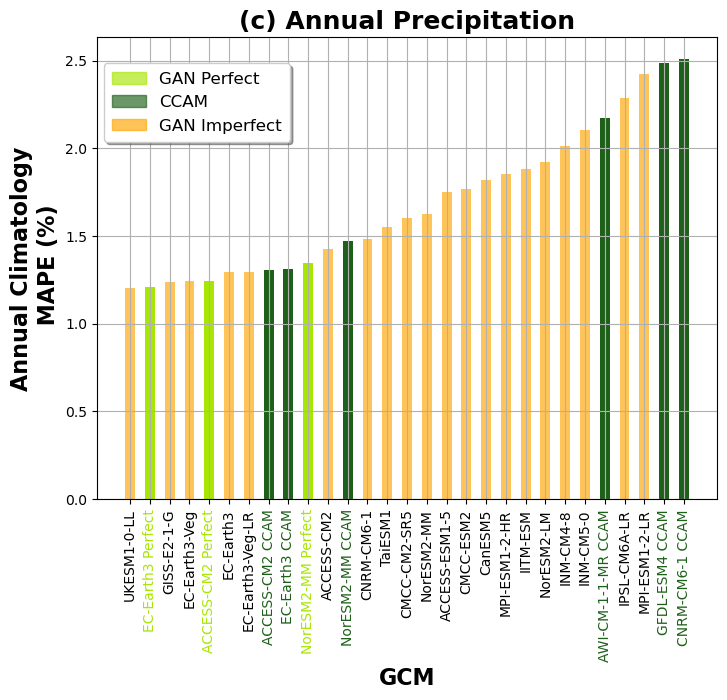

In [771]:

import matplotlib.patches as mpatches
grass_light = "#A8E603"  # Light green
forest_green = "#1E6019"  # Dark green
# Define custom legend items
legend_labels = ["GAN Perfect", "CCAM", 'GAN Imperfect']
#legend_colors = ["green", "yellow", "orange"]
cb_colors = [grass_light, forest_green, 'orange']
# Create patches for legend
patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure

#ax_map.set_title('(a) Tasmax', fontsize=30, pad =120, weight ='bold') 
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 6))



values = error_em.mean(["latitude", "longitude"]).to_pandas().sort_values()

xtick_colors = []  # Store colors for xticklabels

for index, value in enumerate(values.items()):
    if "Perfect" in value[0]:
        ax.bar(index, value[1], width=0.5, color=grass_light)
        xtick_colors.append(grass_light)  # Store the label color
    elif "CCAM" in value[0]:
        ax.bar(index, value[1], width=0.5, color=forest_green)
        xtick_colors.append(forest_green)
    else:
        ax.bar(index, value[1], width=0.5, color="orange", alpha=0.65)
        xtick_colors.append("black")  # Default black for other labels

ax.set_xticks(range(len(values)))
ax.set_xticklabels(values.index, rotation=90)

# Set tick label colors dynamically
for tick, color in zip(ax.get_xticklabels(), xtick_colors):
    tick.set_color(color)
plt.grid('on')
plt.ylabel("Annual Climatology\n MAPE (%)", weight ='bold', fontsize =16)
plt.xlabel('GCM', weight ='bold', fontsize =16)
plt.title('(c) Annual Precipitation', weight ='bold', fontsize =18)
fig.legend(handles=patches, loc="upper center",fontsize =12, fancybox =True, framealpha = 1, shadow = True, borderpad = 0.5, bbox_to_anchor =(0.25, 0.85))
plt.show()
##fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Annual_historical_error.png', dpi =500, bbox_inches ='tight')
##fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Annual_historical_error.pdf', dpi =500, bbox_inches ='tight')

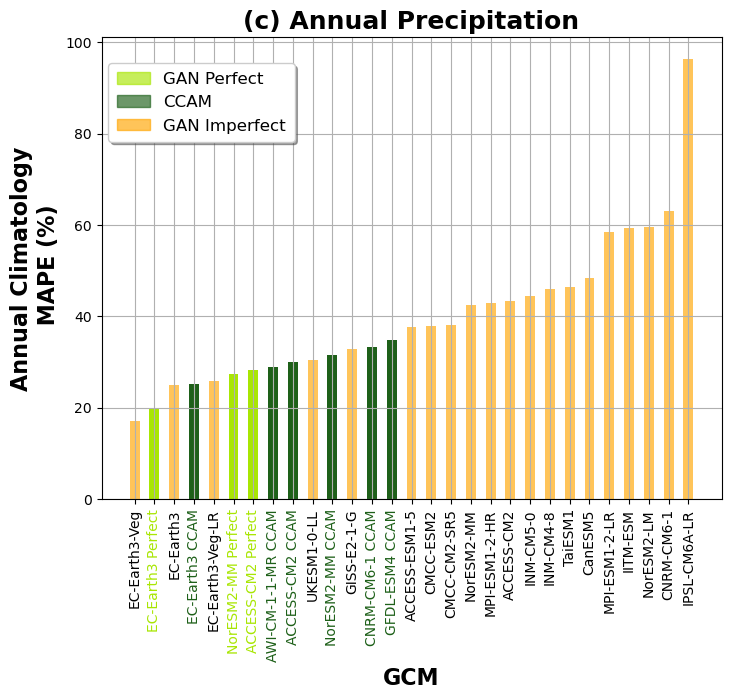

In [259]:
an_index = abs(error_em).mean(["latitude","longitude"]).to_pandas().sort_values().index

In [262]:
an_index.shape

(29,)

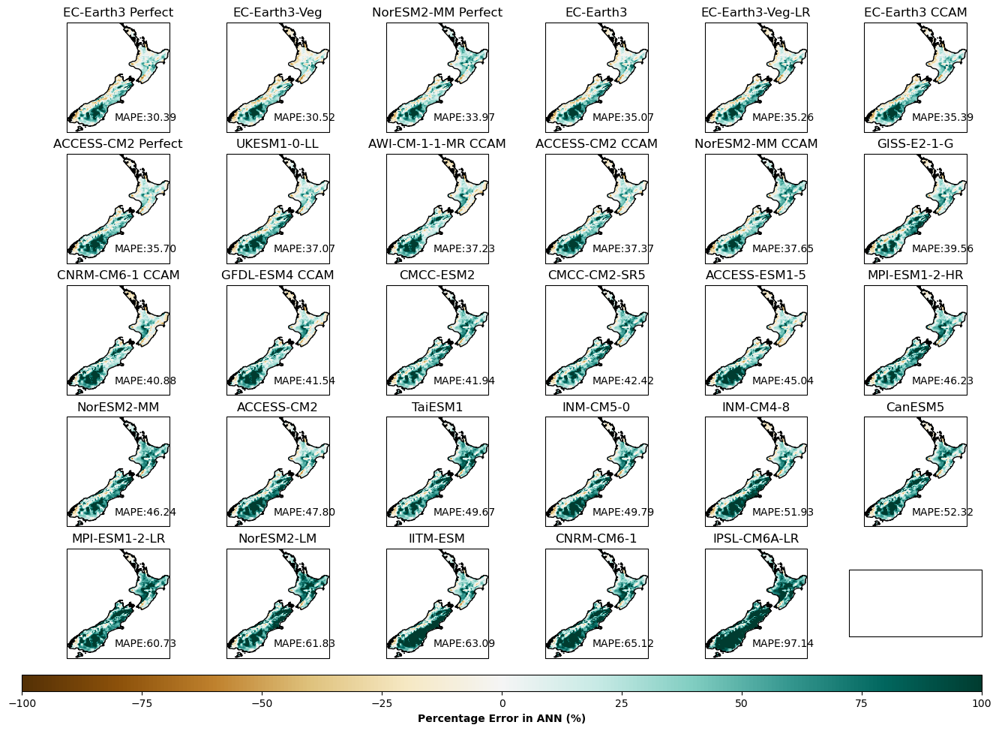

In [265]:
an_index = abs(error_em).mean(["latitude","longitude"]).to_pandas().sort_values().index
fig, ax =plt.subplots(5,6, figsize =(16, 11), subplot_kw =dict(projection = ccrs.PlateCarree(central_longitude = 171.77)))
axes = ax.ravel()
for i in range(len(axes)-1):
    cs = error_em.sel(GCM =an_index[i]).plot(ax = axes[i], cmap ='BrBG', vmin =-100, vmax =100, add_colorbar=False, zorder =14, transform = ccrs.PlateCarree())
    axes[i].coastlines('10m', zorder =15)
    axes[i].set_title(f'{an_index[i]}')
    axes[i].text(172, -46, f'MAPE:{"%.2f" % abs(error_em.sel(GCM =an_index[i])).mean()}', transform = ccrs.PlateCarree())
ax4 = fig.add_axes([0.1, 0.07, 0.8, 0.02])
cbar = fig.colorbar(cs, cax= ax4, orientation ='horizontal')
cbar.set_label('Percentage Error in ANN (%)', weight ='bold')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Ann_spatial_error.png', dpi =500, bbox_inches ='tight')

In [406]:
import xarray as xr

In [210]:
files = glob.glob(r'/nesi/nobackup/niwa03712/CCAM_Indicators/output/historical/static_maps/Rx1day/*_base_bp1986-2005_ANN_NZ12km.nc')

In [211]:
files[0].split('_')[-6]

'TaiESM1'

In [212]:
dfs = []
gcms = []
for file in files:
    df = xr.open_dataset(file)
    #print(df)
    dfs.append(df.squeeze().drop("time"))
    gcm = file.split('_')[-6]
    gcms.append(gcm)

In [213]:
concat_hist = xr.concat(dfs, dim ="GCM")
concat_hist['GCM'] = (('GCM'), gcms)

In [190]:
# files = glob.glob(r'//scale_wlg_persistent/filesets/project/niwa03712/rampaln/CCAM_CMIP6_indicators/output/ssp585/static_maps/Rx1day/*_fp2080-2099_bp1986-2005_ANN_NZ12km.nc')
# dfs = []
# gcms = []
# for file in files:
#     df = xr.open_dataset(file)
#     #print(df)
#     dfs.append(df.squeeze().drop("time"))
#     gcm = file.split('_')[-7]
#     gcms.append(gcm)

In [206]:
concat = xr.concat(dfs, dim ="GCM")
concat['GCM'] = (('GCM'), gcms)

In [252]:
ccam_historical

<xarray.Dataset>
Dimensions:                 (GCM: 6, lon: 179, lat: 172, year: 141, season: 4)
Coordinates:
  * GCM                     (GCM) object 'ACCESS-CM2' ... 'NorESM2-MM'
  * lon                     (lon) float32 164.9 165.0 165.1 ... 183.9 184.0
  * lat                     (lat) float32 -51.21 -51.11 -51.0 ... -32.97 -32.86
  * year                    (year) int64 1960 1961 1962 1963 ... 2098 2099 2100
  * season                  (season) object 'DJF' 'JJA' 'MAM' 'SON'
Data variables:
    Rx1day                  (GCM, year, lat, lon) float64 ...
    seasonal_pr_future      (GCM, season, lat, lon) float32 ...
    seasonal_pr_hist        (GCM, season, lat, lon) float32 3.912e-05 ... 4.0...
    TXx                     (GCM, year, lat, lon) float32 ...
    seasonal_tasmax_future  (GCM, season, lat, lon) float32 ...
    seasonal_tasmax_hist    (GCM, season, lat, lon) float32 ...

In [266]:
climo_true = observations.sel(time = slice("1986","2005")).groupby('time.year').max().mean("year")
climo_true = climo_true.interp(latitude = concat.latitude, longitude = concat.longitude, method ='linear')
true_data_rx1day = ccam_historical.sel(year = slice(1986,2005)).mean("year").Rx1day


In [267]:
perfect_model_climo =perfect_model.pr.sel(time = slice("1986","2005")).groupby('time.year').max().mean("year")
perfect_model_climo =perfect_model_climo.interp(lat = concat.latitude, lon = concat.longitude, method ='linear')

In [268]:
error_em = 100 * (concat_hist.Rx1day -climo_true.rain_council)/climo_true.rain_council
error_ccam = 100 * (true_data_rx1day - climo_true.rain_council )/climo_true.rain_council
error_perfect = 100 * (perfect_model_climo - climo_true.rain_council )/climo_true.rain_council

In [269]:
error_perfect = 100 * (perfect_model_climo - climo_true.rain_council )/climo_true.rain_council
error_perfect = error_perfect.sel(GCM =['ACCESS-CM2','EC-Earth3','NorESM2-MM'])

In [227]:
error_perfect 

<xarray.DataArray (GCM: 5, latitude: 260, longitude: 243)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * GCM        (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'EC-Earth3'
    lat        (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
    lon        (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5

In [271]:
error_em

<xarray.DataArray (GCM: 20, latitude: 260, longitude: 243)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
  * GCM        (GCM) <U16 'TaiESM1' 'IITM-ESM' ... 'NorESM2-LM' 'UKESM1-0-LL'

In [272]:

error_perfect['GCM'] = [str(i) +' Perfect' for i in error_perfect['GCM'].values]
error_ccam['GCM'] = [str(i) +' CCAM' for i in error_ccam['GCM'].values]
error_em['GCM'] =(('GCM'), gcms)
error_em = xr.concat([error_em, error_ccam, error_perfect], dim ="GCM")
new_error =error_em.stack(z =['latitude','longitude']).dropna("z")
index = new_error.median("z").to_pandas().sort_values().index
import matplotlib.patches as mpatches
grass_light = "#A8E603"  # Light green
forest_green = "#1E6019"  # Dark green
# Define custom legend items
legend_labels = ["GAN Perfect", "CCAM", 'GAN Imperfect']
#legend_colors = ["green", "yellow", "orange"]
cb_colors = [grass_light, forest_green, 'orange']
# Create patches for legend


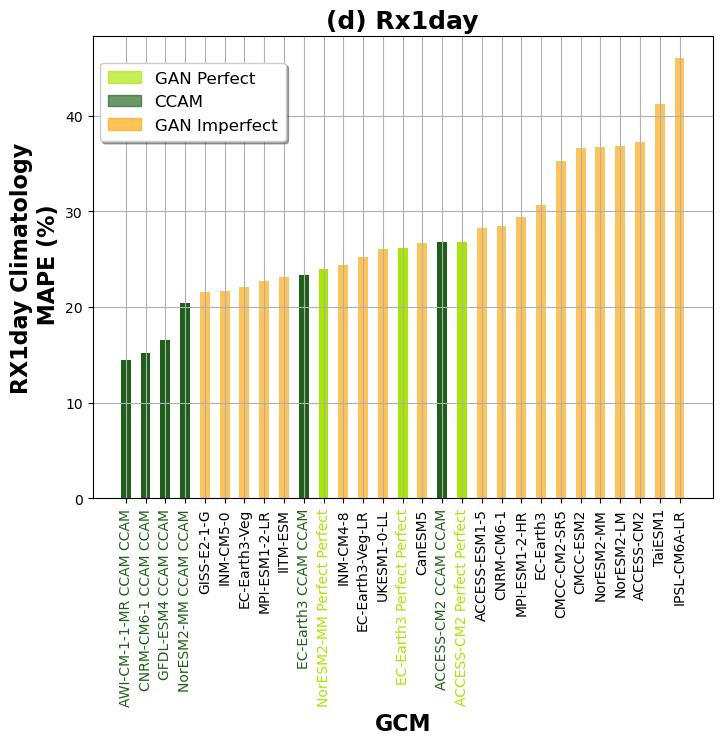

In [240]:
patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure

#ax_map.set_title('(a) Tasmax', fontsize=30, pad =120, weight ='bold') 
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 6))



values = error_em.mean(["latitude", "longitude"]).to_pandas().sort_values()

xtick_colors = []  # Store colors for xticklabels

for index, value in enumerate(values.items()):
    if "Perfect" in value[0]:
        ax.bar(index, value[1], width=0.5, color=grass_light)
        xtick_colors.append(grass_light)  # Store the label color
    elif "CCAM" in value[0]:
        ax.bar(index, value[1], width=0.5, color=forest_green)
        xtick_colors.append(forest_green)
    else:
        ax.bar(index, value[1], width=0.5, color="orange", alpha=0.65)
        xtick_colors.append("black")  # Default black for other labels

ax.set_xticks(range(len(values)))
ax.set_xticklabels(values.index, rotation=90)

# Set tick label colors dynamically
for tick, color in zip(ax.get_xticklabels(), xtick_colors):
    tick.set_color(color)
plt.grid('on')
plt.ylabel("RX1day Climatology\n MAPE (%)", weight ='bold', fontsize =16)
plt.xlabel('GCM', weight ='bold', fontsize =16)
plt.title('(d) Rx1day', weight ='bold', fontsize =18)
fig.legend(handles=patches, loc="upper center",fontsize =12, fancybox =True, framealpha = 1, shadow = True, borderpad = 0.5, bbox_to_anchor =(0.25, 0.85))
plt.show()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_historical_error.png', dpi =500, bbox_inches ='tight')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_historical_error.pdf', dpi =500, bbox_inches ='tight')

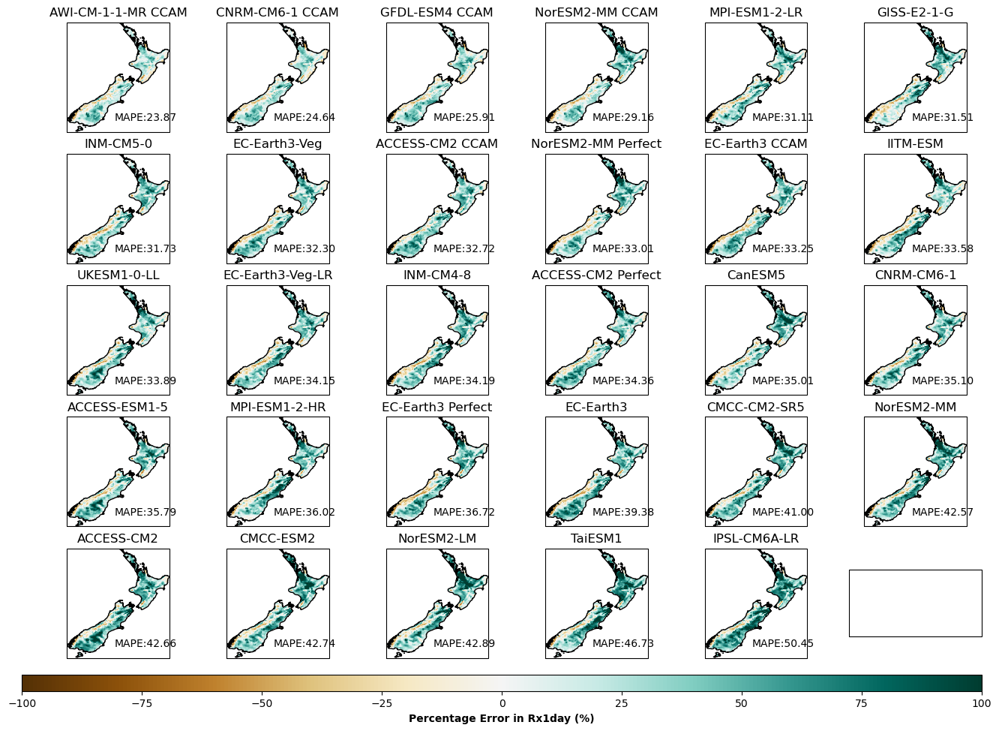

In [274]:
an_index = abs(error_em).mean(["latitude","longitude"]).to_pandas().sort_values().index
fig, ax =plt.subplots(5,6, figsize =(16, 11), subplot_kw =dict(projection = ccrs.PlateCarree(central_longitude = 171.77)))
axes = ax.ravel()
for i in range(len(axes)-1):
    cs = error_em.sel(GCM =an_index[i]).plot(ax = axes[i], cmap ='BrBG', vmin =-100, vmax =100, add_colorbar=False, zorder =14, transform = ccrs.PlateCarree())
    axes[i].coastlines('10m', zorder =15)
    axes[i].set_title(f'{an_index[i]}')
    axes[i].text(172, -46, f'MAPE:{"%.2f" % abs(error_em.sel(GCM =an_index[i])).mean()}', transform = ccrs.PlateCarree())
ax4 = fig.add_axes([0.1, 0.07, 0.8, 0.02])
cbar = fig.colorbar(cs, cax= ax4, orientation ='horizontal')
cbar.set_label('Percentage Error in Rx1day (%)', weight ='bold')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/rx1day_spatial_error.png', dpi =500, bbox_inches ='tight')

In [379]:
true_future_climo = true_data.sel(time = slice("2080","2099")).groupby('time.season').mean()
true_data_climo = true_data.sel(time = slice("1986","2005")).groupby('time.season').mean()
cc_signal = (true_future_climo - true_data_climo)/true_data_climo
cc_signal = cc_signal.interp(lat = concat_djf.latitude, lon = concat_djf.longitude, method ='linear', kwargs = dict(fill_value ='extrapolate'))
cc_signal = cc_signal.where(~concat_djf.isel(GCM =0).isnull(), np.nan)

In [408]:
cc_signal = cc_signal.where(~concat_djf.isel(GCM =0).isnull(), np.nan)

In [409]:
cc_signal_jja = cc_signal.sel(season ='JJA').stack(z =['latitude','longitude']).dropna("z")
cc_signal_djf = cc_signal.sel(season ='DJF').stack(z =['latitude','longitude']).dropna("z")

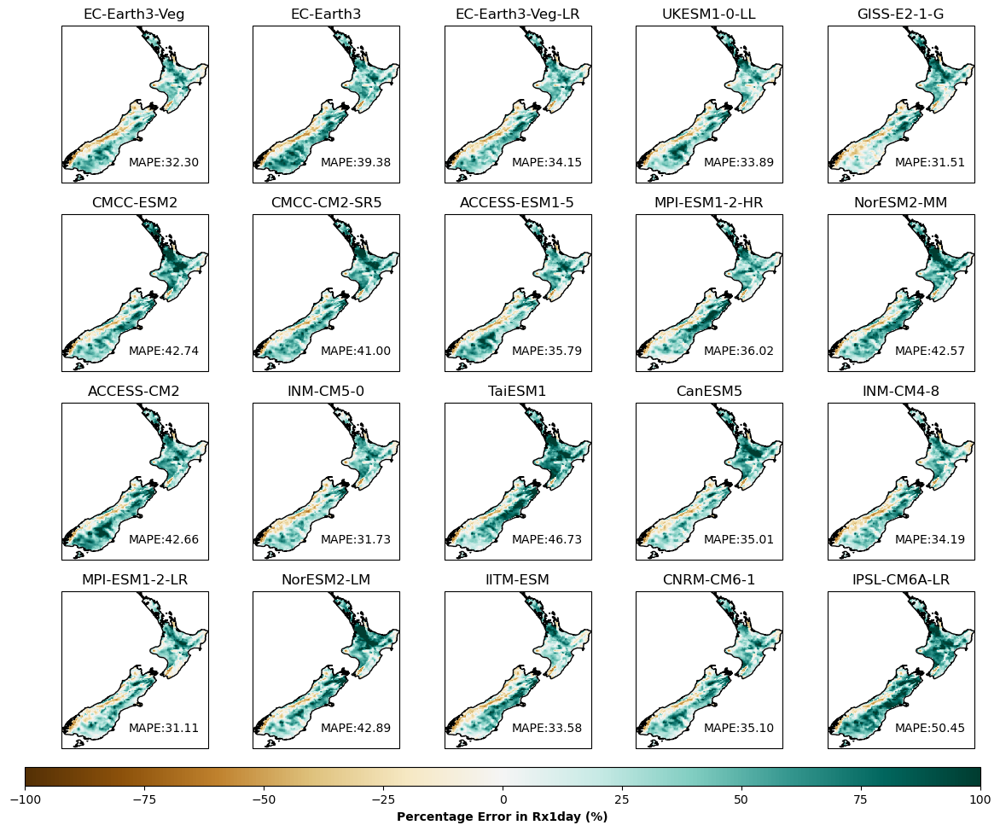

In [145]:
fig, ax =plt.subplots(4,5, figsize =(14, 11), subplot_kw =dict(projection = ccrs.PlateCarree(central_longitude = 171.77)))
axes = ax.ravel()
for i in range(len(axes)):
    cs = error_em.sel(GCM =an_index[i]).plot(ax = axes[i], cmap ='BrBG', vmin =-100, vmax =100, add_colorbar=False, zorder =14, transform = ccrs.PlateCarree())
    axes[i].coastlines('10m', zorder =15)
    axes[i].set_title(f'{an_index[i]}')
    axes[i].text(172, -46, f'MAPE:{"%.2f" % abs(error_em.sel(GCM =an_index[i])).mean()}', transform = ccrs.PlateCarree())
ax4 = fig.add_axes([0.1, 0.07, 0.8, 0.02])
cbar = fig.colorbar(cs, cax= ax4, orientation ='horizontal')
cbar.set_label('Percentage Error in Rx1day (%)', weight ='bold')

In [244]:
season = 'JJA'
files_ai = glob.glob(f'/nesi/nobackup/niwa03712/CCAM_Indicators/output/ssp370/static_maps/PR/*_fp2080-2099_bp1986-2005_{season}_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_future = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
concat_future['GCM'] = (('GCM'), gcm)

files_ai = glob.glob(f'/nesi/nobackup/niwa03712/CCAM_Indicators/output/historical/static_maps/PR/*bp1986-2005_{season}_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_base = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
concat_base['GCM'] = (('GCM'), gcm)

concat_jja = 100 * concat_future/concat_base

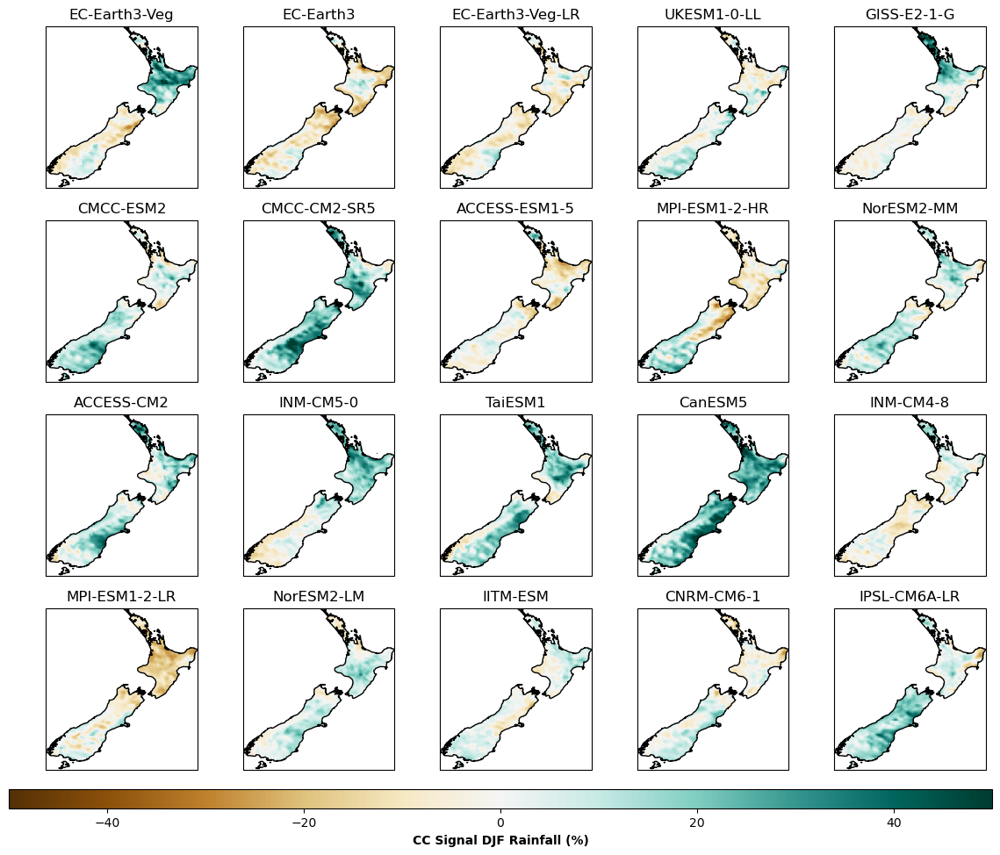

In [344]:
fig, ax =plt.subplots(4,5, figsize =(14, 11), subplot_kw =dict(projection = ccrs.PlateCarree(central_longitude = 171.77)))
axes = ax.ravel()
for i in range(len(axes)):
    cs = concat_djf.sel(GCM =an_index[i]).PR.plot(ax = axes[i], cmap ='BrBG', vmin =-50, vmax =50, add_colorbar=False, zorder =14, transform = ccrs.PlateCarree())
    axes[i].coastlines('10m', zorder =15)
    axes[i].set_title(f'{an_index[i]}')
    #axes[i].text(172, -46, f'MAPE:{"%.2f" % abs(error_em.sel(GCM =an_index[i])).mean()}', transform = ccrs.PlateCarree())
ax4 = fig.add_axes([0.1, 0.07, 0.8, 0.02])
cbar = fig.colorbar(cs, cax= ax4, orientation ='horizontal')
cbar.set_label('CC Signal DJF Rainfall (%)', weight ='bold')

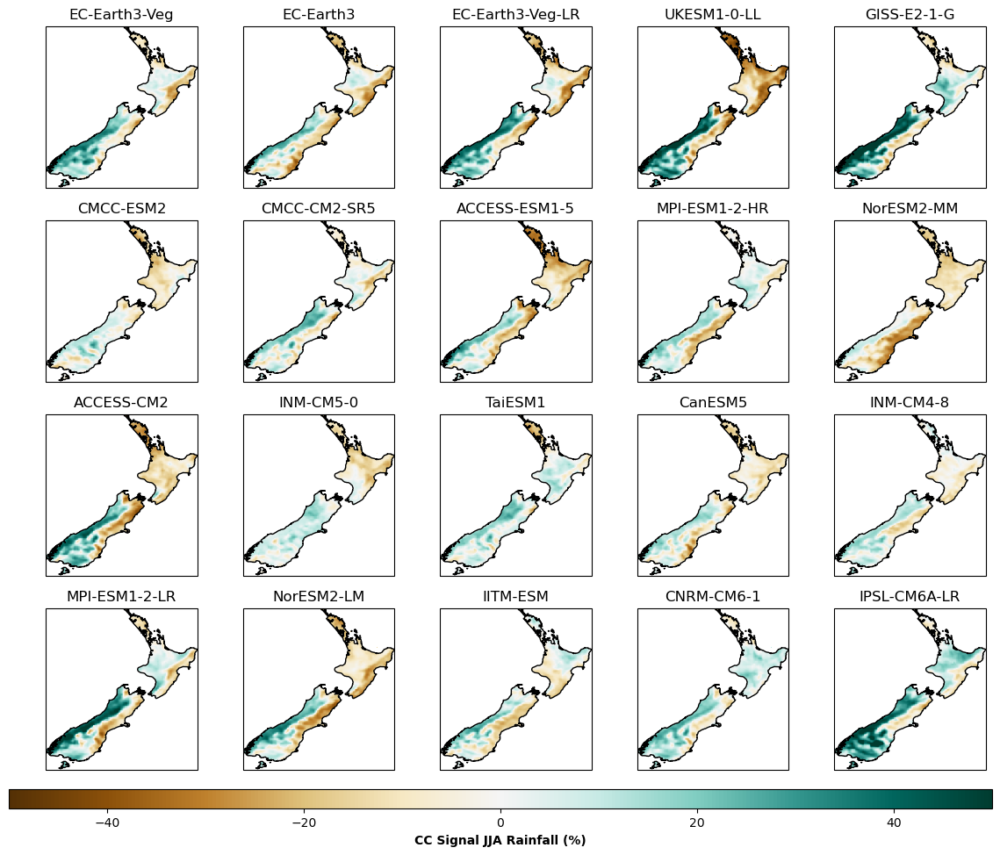

In [346]:
fig, ax =plt.subplots(4,5, figsize =(14, 11), subplot_kw =dict(projection = ccrs.PlateCarree(central_longitude = 171.77)))
axes = ax.ravel()
for i in range(len(axes)):
    cs = concat_jja.sel(GCM =an_index[i]).PR.plot(ax = axes[i], cmap ='BrBG', vmin =-50, vmax =50, add_colorbar=False, zorder =14, transform = ccrs.PlateCarree())
    axes[i].coastlines('10m', zorder =15)
    axes[i].set_title(f'{an_index[i]}')
    #axes[i].text(172, -46, f'MAPE:{"%.2f" % abs(error_em.sel(GCM =an_index[i])).mean()}', transform = ccrs.PlateCarree())
ax4 = fig.add_axes([0.1, 0.07, 0.8, 0.02])
cbar = fig.colorbar(cs, cax= ax4, orientation ='horizontal')
cbar.set_label('CC Signal JJA Rainfall (%)', weight ='bold')

In [270]:
 a = concat_djf.stack(z =["latitude","longitude"]).dropna("z").PR.values

In [282]:
data_pca2.shape

(20, 2)

In [277]:
a2 = concat_jja.stack(z =["latitude","longitude"]).dropna("z").PR.values

In [284]:
concat_space = np.concatenate([a, a2], axis =0)

In [286]:
concat_space.max()

72.87152217594789

In [404]:
concat_djf

<xarray.Dataset>
Dimensions:    (GCM: 20, longitude: 243, latitude: 260)
Coordinates:
  * GCM        (GCM) <U16 'MPI-ESM1-2-HR' 'TaiESM1' ... 'NorESM2-MM'
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
Data variables:
    PR         (GCM, latitude, longitude) float64 nan nan nan ... nan nan nan

In [411]:
cc_signal_jja.PR

<xarray.DataArray 'PR' (GCM: 5, z: 11491)>
array([[-0.24414494, -0.2504185 , -0.25496247, ...,  0.28492073,
         0.28947287,  0.28742911],
       [-0.31473799, -0.32945512, -0.32211177, ...,  0.22337989,
         0.22180494,  0.22460796],
       [-0.16821896, -0.15977089, -0.15898972, ...,  0.20633119,
         0.20434217,  0.20476557],
       [-0.13374476, -0.15969954, -0.13976877, ...,  0.28253978,
         0.32433638,  0.31515828],
       [-0.10955644, -0.14277967, -0.13960316, ...,  0.11919281,
         0.12844384,  0.12278325]])
Coordinates:
  * GCM        (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
    season     <U3 'JJA'
    lat        (z) float64 -34.42 -34.47 -34.47 -34.47 ... -47.22 -47.28 -47.28
    lon        (z) float64 172.9 172.7 172.7 172.8 ... 167.5 167.6 167.5 167.5
  * z          (z) MultiIndex
  - latitude   (z) float64 -34.42 -34.47 -34.47 -34.47 ... -47.22 -47.28 -47.28
  - longitude  (z) float64 172.9 172.7 172.7 172.8 ... 167.5 167.6 167.5 167.5

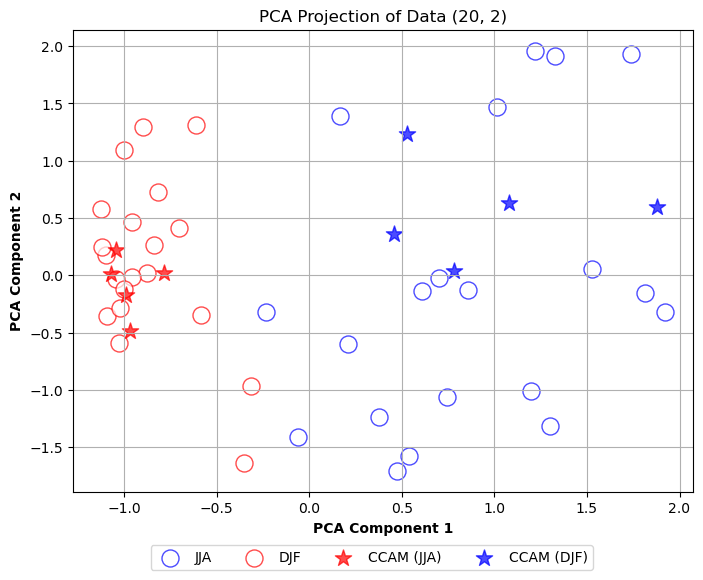

In [441]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Generate a random dataset with shape (20, 11491) for demonstration
np.random.seed(42)
data = a
data2 = a2
sc = StandardScaler()
concat_transform = sc.fit_transform(concat_space.T).T
sc2 = StandardScaler()
concat_transform_jja_ccam = sc2.fit_transform(cc_signal_jja.PR.values.T).T

sc3 = StandardScaler()
concat_transform_djf_ccam= sc3.fit_transform(cc_signal_djf.PR.values.T).T
# Perform PCA, reducing to 2 components
pca = PCA(n_components=2,svd_solver='auto', whiten =True)
data_pca = pca.fit_transform(concat_transform)
data_pca_jja_ccam = pca.transform(concat_transform_jja_ccam)
data_pca_djf_ccam = pca.transform(concat_transform_djf_ccam)

# Scatter plot of the first two principal components
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(data_pca[:20, 0], data_pca[:20, 1], color='b', alpha=0.7, fc ='white',s =150, label ='JJA')

ax.scatter(data_pca[20:, 0], data_pca[20:, 1], color='r', alpha=0.7, fc ='white',s =150, label ='DJF')
ax.scatter(data_pca_jja_ccam[:, 0], data_pca_jja_ccam[:, 1], color='r', alpha=0.7 ,s =150, marker ='*', label ='CCAM (JJA)')
ax.scatter(data_pca_djf_ccam[:, 0], data_pca_djf_ccam[:, 1], color='b', alpha=0.7 ,s =150, marker ='*', label ='CCAM (DJF)')
ax.set_xlabel("PCA Component 1", weight ='bold')
ax.set_ylabel("PCA Component 2", weight ='bold')
ax.set_title("PCA Projection of Data (20, 2)")
ax.grid(True)
#a.show()
ax.legend(ncol =4, bbox_to_anchor = (0.85, -0.1))

# Reproject the 2D PCA data back to the original 11,491-dimensional space


/tmp/ipykernel_177009/1033910562.py:24: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_pca[:20, 1], ax=ax4, color='blue', linewidth=2.5, vertical =True)  # Density along x-axis
/tmp/ipykernel_177009/1033910562.py:29: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_pca[20:, 1], ax=ax4, color='r', linewidth=2.5, vertical =True)
/tmp/ipykernel_177009/1033910562.py:33: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `x`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_pca[:20, 0], ax=ax5, color='blue', linewidth=2.5, vertical =False)
/tmp/ipykernel_177009/1033910562.py:44: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `x`.
This will become an error in seabor

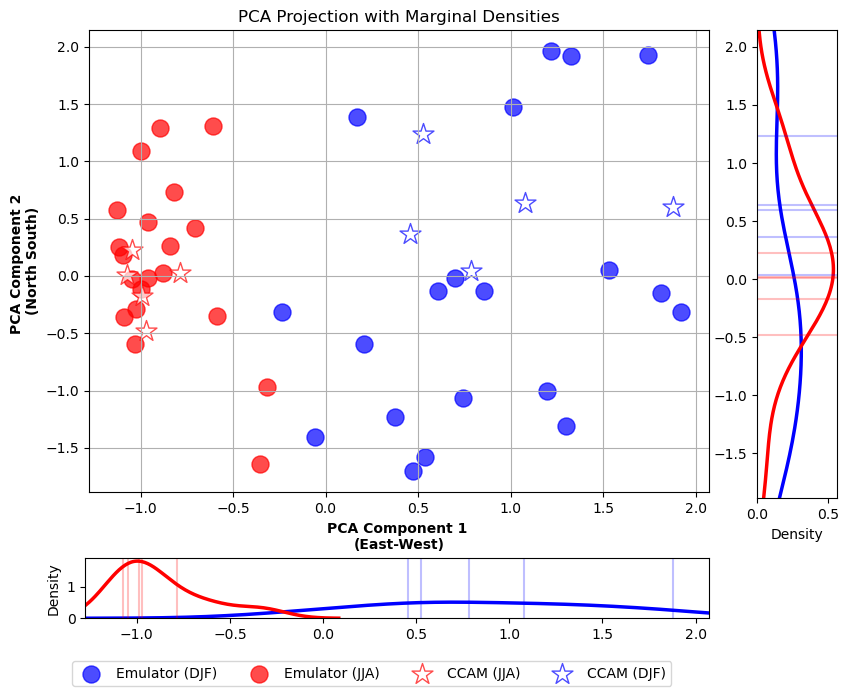

In [519]:
import seaborn as sns

# Create a figure with marginal density plots
fig, ax = plt.subplots(figsize=(8, 6))

# Scatter plot of PCA results
ax.scatter(data_pca[:20, 0], data_pca[:20, 1], color='b', alpha=0.7, s=150, label='Emulator (DJF)')
ax.scatter(data_pca[20:, 0], data_pca[20:, 1], color='r', alpha=0.7, s=150, label='Emulator (JJA)')
ax.scatter(data_pca_jja_ccam[:, 0], data_pca_jja_ccam[:, 1], color='r', alpha=0.7, s=250, marker='*', label='CCAM (JJA)', fc = 'white')
ax.scatter(data_pca_djf_ccam[:, 0], data_pca_djf_ccam[:, 1], color='b', alpha=0.7, s=250, marker='*', label='CCAM (DJF)', fc = 'white')

# Labels and title
ax.set_xlabel("PCA Component 1 \n(East-West)", weight='bold')
ax.set_ylabel("PCA Component 2 \n(North South)", weight='bold')
ax.set_title("PCA Projection with Marginal Densities")
ax.grid(True)
ax.legend(ncol=4, bbox_to_anchor=(0.95, -0.35))
ax4 = fig.add_axes([0.96, 0.1, 0.1, 0.78])
ax5 = fig.add_axes([0.12, -0.1, 0.78, 0.1])
ax4.set_ylim(ax.get_ylim())
ax5.set_xlim(ax.get_xlim())
# Create marginal density plots
# Density along y-axis
sns.kdeplot(data_pca[:20, 1], ax=ax4, color='blue', linewidth=2.5, vertical =True)  # Density along x-axis
#sns.kdeplot(data_pca_djf_ccam[:, 1], ax=ax4, color='blue', linewidth=1.5, vertical =True, alpha =0.45)
#sns.kdeplot(data_pca_jja_ccam[:, 1], ax=ax4, color='red', linewidth=1.5, vertical =True, alpha =0.45)


sns.kdeplot(data_pca[20:, 1], ax=ax4, color='r', linewidth=2.5, vertical =True)



sns.kdeplot(data_pca[:20, 0], ax=ax5, color='blue', linewidth=2.5, vertical =False)
for i in range(5):# Density along x-axis
    ax4.axhline(data_pca_djf_ccam[i, 1], color ='b', alpha =0.25)
    ax4.axhline(data_pca_jja_ccam[i, 1], color ='r', alpha =0.25)
    
    ax5.axvline(data_pca_djf_ccam[i, 0], color ='b', alpha =0.25)
    ax5.axvline(data_pca_jja_ccam[i, 0], color ='r', alpha =0.25)
#sns.kdeplot(data_pca_djf_ccam[:, 0], ax=ax5, color='blue', linewidth=1.5, vertical =False, alpha =0.45)
#sns.kdeplot(data_pca_jja_ccam[:, 0], ax=ax5, color='red', linewidth=1.5, vertical =False, alpha =0.45)


sns.kdeplot(data_pca[20:, 0], ax=ax5, color='r', linewidth=2.5, vertical =False)
plt.show()


In [ ]:
# Repeat this analysis with internal variability ensemble

In [363]:
concat_jja

<xarray.Dataset>
Dimensions:    (GCM: 20, longitude: 243, latitude: 260)
Coordinates:
  * GCM        (GCM) <U16 'IITM-ESM' 'UKESM1-0-LL' ... 'EC-Earth3-Veg-LR'
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
Data variables:
    PR         (GCM, latitude, longitude) float64 nan nan nan ... nan nan nan

In [ ]:
# Varimax (methodologY)

In [366]:
components = concat_jja.stack(z =["latitude","longitude"]).dropna("z").PR.isel(GCM = slice(0,2))

In [ ]:
components = concat_jja.stack(z =["latitude","longitude"]).dropna("z").PR.isel(GCM = slice(0,2))
components.values = pca.components_
components = components.unstack()
components = components.reindex(longitude = sorted(components.longitude.values))#

In [368]:
components.values = pca.components_

In [370]:
components = components.unstack()

In [371]:
components = components.reindex(longitude = sorted(components.longitude.values))#

Text(0.5, 1.0, 'Principal Component 2 (North South)')

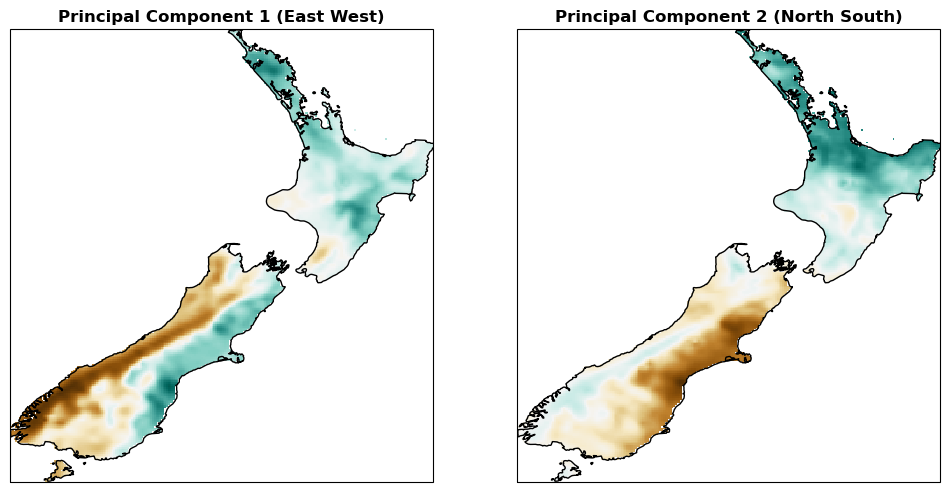

In [516]:
fig, ax = plt.subplots(1, 2, figsize = (12, 6), subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77))
                      )
components.isel(GCM =0).plot(ax = ax[0], transform = ccrs.PlateCarree(), cmap ='BrBG', add_colorbar =False)
components.isel(GCM =1).plot(ax = ax[1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG',)
ax[0].coastlines('10m')

ax[1].coastlines('10m')
ax[0].set_title('Principal Component 1 (East West)', weight ='bold')
ax[1].set_title('Principal Component 2 (North South)', weight ='bold')

In [560]:
season = 'JJA'
files_ai = glob.glob(f'/nesi/nobackup/niwa03712/CCAM_Indicators/output/ssp370/static_maps/Rx1day/*_fp2080-2099_bp1986-2005_ANN_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_future = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
concat_future['GCM'] = (('GCM'), gcm)

files_ai = glob.glob(f'/nesi/nobackup/niwa03712/CCAM_Indicators/output/historical/static_maps/Rx1day/*bp1986-2005_ANN_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_base = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
concat_base['GCM'] = (('GCM'), gcm)

concat_rx1day = 100 * concat_future/concat_base

In [571]:
concat_stacked = concat_rx1day.Rx1day.stack(z=['latitude','longitude']).dropna("z")

In [572]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Generate a random dataset with shape (20, 11491) for demonstration
np.random.seed(42)
data = a
data2 = a2
sc = StandardScaler()
concat_transform = sc.fit_transform(concat_stacked.values.T).T
# Perform PCA, reducing to 2 components
pca = PCA(n_components=2,svd_solver='auto', whiten =True)
data_pca = pca.fit_transform(concat_transform)


In [576]:
true_future_climo_max = true_data.sel(time = slice("2080","2099")).groupby('time.year').max().mean("year")
true_data_climo_max = true_data.sel(time = slice("1986","2005")).groupby('time.year').max().mean("year")
cc_signal_max = (true_future_climo_max - true_data_climo_max)/true_data_climo_max
cc_signal_max = cc_signal_max.interp(lat = concat_djf.latitude, lon = concat_djf.longitude, method ='linear', kwargs = dict(fill_value ='extrapolate'))
cc_signal_max = cc_signal_max.where(~concat_djf.isel(GCM =0).isnull(), np.nan)

In [578]:
cc_signal_max  = cc_signal_max.PR.stack(z = ['latitude','longitude']).dropna("z")

In [583]:
sc2 = StandardScaler()
concat_transform2 = sc2.fit_transform(cc_signal_max.values.T).T
data_pca2 = pca.transform(concat_transform2)
# Perform PCA, reducing to 2 components

/tmp/ipykernel_177009/2069626237.py:24: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_pca[:20, 1], ax=ax4, color='blue', linewidth=2.5, vertical =True)  # Density along x-axis
/tmp/ipykernel_177009/2069626237.py:29: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_pca[20:, 1], ax=ax4, color='r', linewidth=2.5, vertical =True)
/tmp/ipykernel_177009/2069626237.py:33: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `x`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_pca[:20, 0], ax=ax5, color='blue', linewidth=2.5, vertical =False)
/tmp/ipykernel_177009/2069626237.py:44: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `x`.
This will become an error in seabor

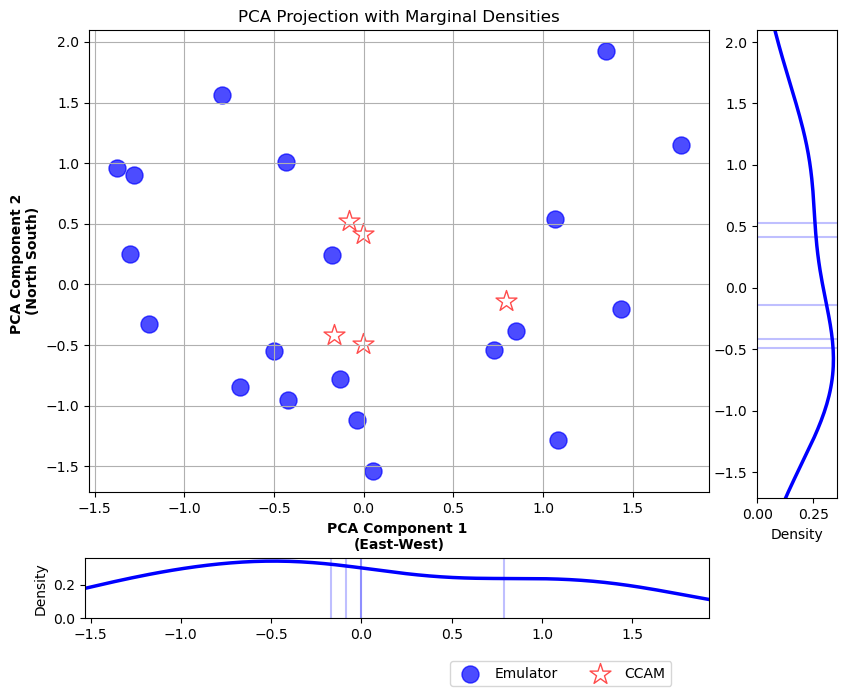

In [585]:
import seaborn as sns

# Create a figure with marginal density plots
fig, ax = plt.subplots(figsize=(8, 6))

# Scatter plot of PCA results
ax.scatter(data_pca[:20, 0], data_pca[:20, 1], color='b', alpha=0.7, s=150, label='Emulator')
#ax.scatter(data_pca[20:, 0], data_pca[20:, 1], color='r', alpha=0.7, s=150, label='Emulator (JJA)')
ax.scatter(data_pca2[:, 0], data_pca2[:, 1], color='r', alpha=0.7, s=250, marker='*', label='CCAM', fc = 'white')
#ax.scatter(data_pca_djf_ccam[:, 0], data_pca_djf_ccam[:, 1], color='b', alpha=0.7, s=250, marker='*', label='CCAM (DJF)', fc = 'white')

# Labels and title
ax.set_xlabel("PCA Component 1 \n(East-West)", weight='bold')
ax.set_ylabel("PCA Component 2 \n(North South)", weight='bold')
ax.set_title("PCA Projection with Marginal Densities")
ax.grid(True)
ax.legend(ncol=4, bbox_to_anchor=(0.95, -0.35))
ax4 = fig.add_axes([0.96, 0.1, 0.1, 0.78])
ax5 = fig.add_axes([0.12, -0.1, 0.78, 0.1])
ax4.set_ylim(ax.get_ylim())
ax5.set_xlim(ax.get_xlim())
# Create marginal density plots
# Density along y-axis
sns.kdeplot(data_pca[:20, 1], ax=ax4, color='blue', linewidth=2.5, vertical =True)  # Density along x-axis
#sns.kdeplot(data_pca_djf_ccam[:, 1], ax=ax4, color='blue', linewidth=1.5, vertical =True, alpha =0.45)
#sns.kdeplot(data_pca_jja_ccam[:, 1], ax=ax4, color='red', linewidth=1.5, vertical =True, alpha =0.45)


sns.kdeplot(data_pca[20:, 1], ax=ax4, color='r', linewidth=2.5, vertical =True)



sns.kdeplot(data_pca[:20, 0], ax=ax5, color='blue', linewidth=2.5, vertical =False)
for i in range(5):# Density along x-axis
    ax4.axhline(data_pca2[i, 1], color ='b', alpha =0.25)
    #ax4.axhline(data_pca_jja_ccam[i, 1], color ='r', alpha =0.25)
    
    ax5.axvline(data_pca2[i, 0], color ='b', alpha =0.25)
    #ax5.axvline(data_pca_jja_ccam[i, 0], color ='r', alpha =0.25)
#sns.kdeplot(data_pca_djf_ccam[:, 0], ax=ax5, color='blue', linewidth=1.5, vertical =False, alpha =0.45)
#sns.kdeplot(data_pca_jja_ccam[:, 0], ax=ax5, color='red', linewidth=1.5, vertical =False, alpha =0.45)


sns.kdeplot(data_pca[20:, 0], ax=ax5, color='r', linewidth=2.5, vertical =False)
plt.show()


In [587]:
concat_jja

<xarray.Dataset>
Dimensions:    (GCM: 20, longitude: 243, latitude: 260)
Coordinates:
  * GCM        (GCM) <U16 'CanESM5' 'EC-Earth3-Veg' ... 'CMCC-ESM2'
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
Data variables:
    Rx1day     (GCM, latitude, longitude) float64 nan nan nan ... nan nan nan

Text(0.5, 1.0, 'Principal Component 2 (North South)')

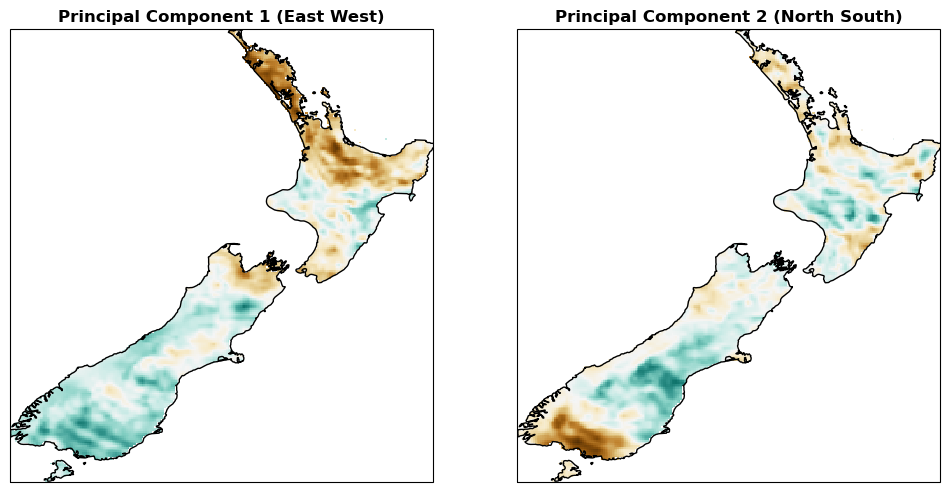

In [588]:
components = concat_jja.stack(z =["latitude","longitude"]).dropna("z").Rx1day.isel(GCM = slice(0,2))
components.values = pca.components_
components = components.unstack()
components = components.reindex(longitude = sorted(components.longitude.values))#
fig, ax = plt.subplots(1, 2, figsize = (12, 6), subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77))
                      )
components.isel(GCM =0).plot(ax = ax[0], transform = ccrs.PlateCarree(), cmap ='BrBG', add_colorbar =False)
components.isel(GCM =1).plot(ax = ax[1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG',)
ax[0].coastlines('10m')

ax[1].coastlines('10m')
ax[0].set_title('Principal Component 1 (East West)', weight ='bold')
ax[1].set_title('Principal Component 2 (North South)', weight ='bold')

In [100]:
def func(x, index = np.arange(2015, 2100)):
    
    coefficients = np.polyfit(index, x.ravel(), 4)

    # Create a polynomial function from the coefficients
    polynomial = np.poly1d(coefficients)

    # Generate x values for plotting the polynomial curve
    x_fit = index#np.linspace(z.index.ravel().min(), z.index.ravel().max(), 500)
    y_fit = polynomial(x_fit)
    return y_fit


In [727]:
ssps = ['ssp126','ssp245', 'ssp585']
full_dset = []
for ssp in ssps:
    files_glob_tx = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/tasmax/tasmax_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')
    #files_glob_pr = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/pr/pr_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_pr_v280125.nc')
    ssp_dset = []
    for file in files_glob_tx:
        #print(files_glob_tx)
        print(file)
        tx = xr.open_dataset(file)
        variant = file.split('/')[-1].split('_')[5]
        ssp = file.split('/')[-1].split('_')[4]
        gcm = file.split('/')[-1].split('_')[3]
        txx = tx.groupby('time.year').max()
        txx_smoothed = xr.apply_ufunc(func, txx.isel(year = slice(0, -1)), input_core_dims=[["year"]], output_core_dims =[["year"]], output_dtypes =[float], vectorize =True,
                             dask = 'parallelized')
        txx_smoothed['tasmax_resid'] = (('year','lat','lon'), (txx.isel(year = slice(0, -1)) -  txx_smoothed).tasmax.values)
        txx_smoothed = txx_smoothed.expand_dims({"GCM":1})
        txx_smoothed['GCM'] = (('GCM'), [gcm])`
        txx_smoothed.attrs['variant'] = [variant]
        ssp_dset.append(txx_smoothed)
    concat_dset = xr.concat(ssp_dset, dim ="GCM")
    concat_dset = concat_dset.expand_dims({"ssp":1})
    concat_dset['ssp'] = (('ssp'), [ssp])
    full_dset.append(concat_dset)
        
    
    print(len(files_glob))
concats = xr.concat(full_dset, dim ="ssp")

/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/tasmax/tasmax_ScenarioMIP_MOHC_UKESM1-0-LL_ssp126_r1i1p1f2_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/tasmax/tasmax_ScenarioMIP_EC-Earth-Consortium_EC-Earth3-Veg_ssp126_r1i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/tasmax/tasmax_ScenarioMIP_AS-RCEC_TaiESM1_ssp126_r1i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/tasmax/tasmax_ScenarioMIP_CCCma_CanESM5_ssp126_r1i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/tasmax/tasmax_ScenarioMIP_CNRM-CERFACS_CNRM-CM6-1_ssp126_r1i1p1f2_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/tasmax/tas

In [722]:
len(ssp_dset)

1

In [728]:
concats = xr.concat(full_dset, dim ="ssp")

In [820]:
concats.to_netcdf(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/TXX_internal_variability_smoothing_decomposition.nc')

In [819]:
ssps = ['ssp370']
full_dset = []
for ssp in ssps:
    files_glob_tx = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/tasmax/tasmax_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')
    #files_glob_pr = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/pr/pr_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_pr_v280125.nc')
    ssp_dset = []
    for file in files_glob_tx:
        print('na')
        if ('CanESM5' in file) | ('ACCESS-ESM1-5' in file):
            #print(files_glob_tx)
            
            tx = xr.open_dataset(file)
            variant = file.split('/')[-1].split('_')[5]
            ssp = file.split('/')[-1].split('_')[4]
            gcm = file.split('/')[-1].split('_')[3]
            print(gcm, variant, ssp)
            txx = tx.groupby('time.year').max()
            txx_smoothed = xr.apply_ufunc(func, txx.isel(year = slice(0, -1)), input_core_dims=[["year"]], output_core_dims =[["year"]], output_dtypes =[float], vectorize =True,
                                 dask = 'parallelized')
            txx_smoothed['tasmax_resid'] = (('year','lat','lon'), (txx.isel(year = slice(0, -1)) -  txx_smoothed).tasmax.values)
            txx_smoothed = txx_smoothed.expand_dims({"GCM_variant":1})
            txx_smoothed['GCM_variant'] = (('GCM_variant'), [f'{gcm}_{variant}'])
            txx_smoothed.attrs['variant'] = [variant]
            ssp_dset.append(txx_smoothed)
    concat_dset = xr.concat(ssp_dset, dim ='GCM_variant')
    concat_dset = concat_dset.expand_dims({"ssp":1})
    concat_dset['ssp'] = (('ssp'), [ssp])
    full_dset.append(concat_dset)
        
    
    

na
na
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CCCma_CanESM5_ssp370_r6i1p2f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
na
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CSIRO_ACCESS-ESM1-5_ssp370_r34i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
na
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CSIRO_ACCESS-ESM1-5_ssp370_r37i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
na
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CCCma_CanESM5_ssp370_r10i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
na
na
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CSIRO_ACCESS-ESM1-5_ssp370_r24i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc
na
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily

In [821]:
print(len(files_glob_tx))

77


In [46]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
concat_internal_variability = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/TXX_internal_variability_smoothing_decomposition_contribution.nc')

In [4]:
concat_internal_variability = concat_internal_variability.stack(z =['GCM', 'GCM_variant']).dropna("z")

In [9]:
concat_internal_variability['tasmax_resid_2'] = (('ssp','lat','lon','year','z'), concat_internal_variability.tasmax_resid.transpose("ssp","lat","lon","time","z").values)

In [11]:
concat_internal_variability['tasmax_resid_2'] = concat_internal_variability['tasmax_resid_2'] + concat_internal_variability['tasmax']

In [16]:
var1 = concat_internal_variability['tasmax_resid_2'].squeeze().sel(z = concat_internal_variability.GCM =='ACCESS-ESM1-5').var("z")
var2 = concat_internal_variability['tasmax_resid_2'].squeeze().sel(z = concat_internal_variability.GCM =='CanESM5').var("z")

In [20]:
original_array = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/TXX_internal_variability_smoothing_decomposition.nc')

In [78]:
I = original_array.tasmax_resid.var(["year","ssp"]).mean(["GCM"])

Text(0.5, 1.0, 'Internal Variability: Large Ensembles vs H&S09')

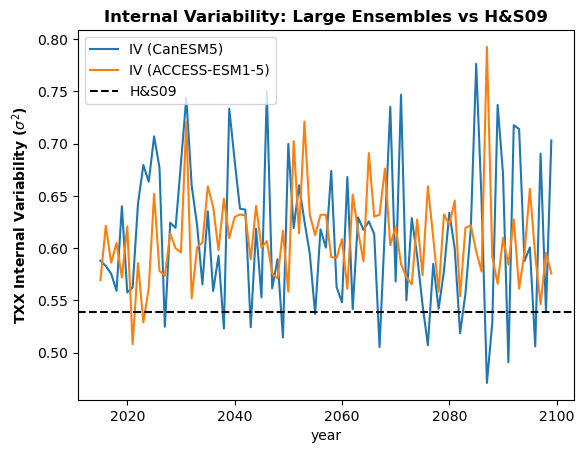

In [79]:
fig, ax = plt.subplots()
var2.mean(["lat","lon"]).plot(ax = ax,label ='IV (CanESM5)')
var1.mean(["lat","lon"]).plot(ax = ax,label ='IV (ACCESS-ESM1-5)')
ax.axhline(I.mean(["lat","lon"]), color ='k', ls ='--', label ='H&S09')
ax.set_ylabel('TXX Internal Variability ($\sigma^2$)', weight ='bold')
ax.legend()
ax.set_title('Internal Variability: Large Ensembles vs H&S09', weight ='bold')

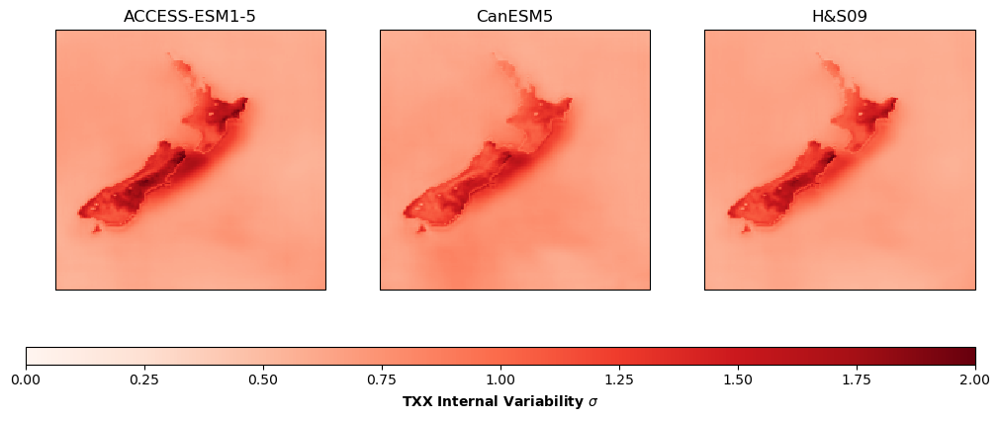

In [81]:
fig, ax = plt.subplots(1,3, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)), figsize = (12, 6))
cs = np.sqrt(var1).mean(["year"]).plot(ax = ax[0], transform = ccrs.PlateCarree(), add_colorbar =False, vmin =0, vmax =2, cmap ='Reds')
np.sqrt(var2).mean(["year"]).plot(ax = ax[1], transform = ccrs.PlateCarree(), add_colorbar =False, vmin =0, vmax =2, cmap ='Reds')
np.sqrt(I).plot(ax = ax[2], transform = ccrs.PlateCarree(), add_colorbar =False, vmin =0, vmax =2, cmap ='Reds')
ax[0].set_title('ACCESS-ESM1-5')
ax[1].set_title('CanESM5')
ax[2].set_title('H&S09')
ax4 = fig.add_axes([0.1, 0.15, 0.8, 0.03])
cbar = fig.colorbar(cs, cax =ax4, orientation = 'horizontal')
cbar.set_label('TXX Internal Variability $\sigma$', weight ='bold')

In [ ]:
I = original_array.tasmax_resid.var(["year","ssp"]).mean(["GCM"])

In [82]:
M = original_array.var("GCM").mean("ssp").tasmax

In [83]:
S = original_array.mean("GCM").var("ssp").tasmax

In [84]:
T = S + M + I

In [85]:
S_ = S/T
M_ = M/T
I_ = I/T

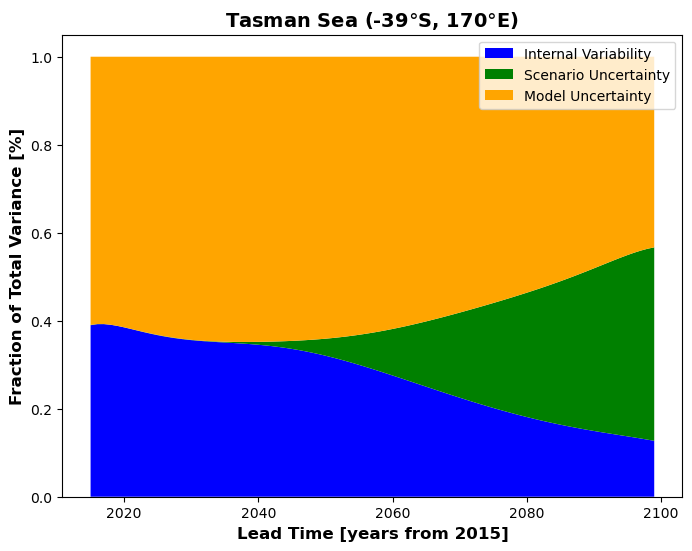

In [96]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 170
ax.stackplot(
    I_.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Tasman Sea (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

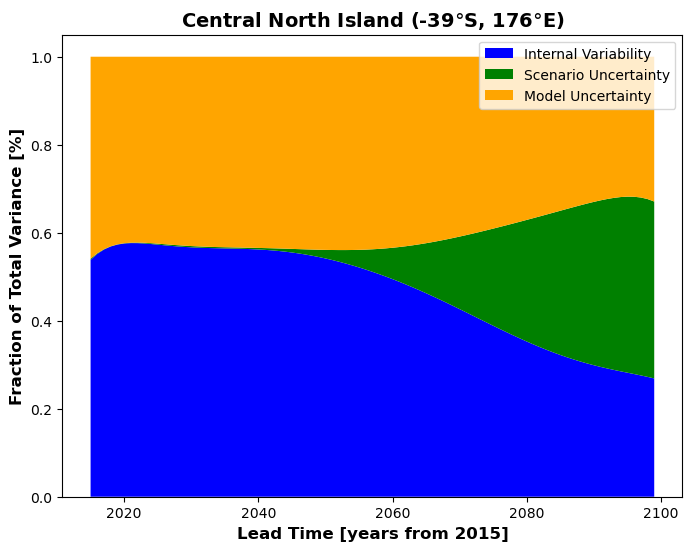

In [95]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 176
ax.stackplot(
    I_.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Central North Island (-39$\degree$S, 176$\degree$E)", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

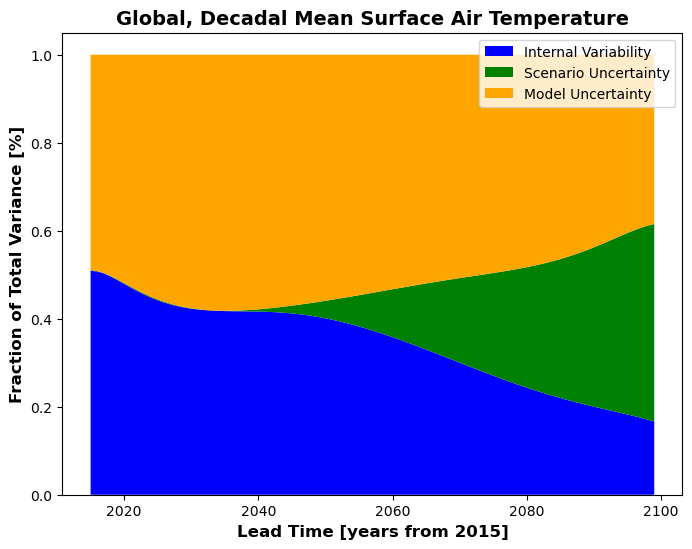

In [94]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-43
lon = 170
ax.stackplot(
    I_.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Global, Decadal Mean Surface Air Temperature", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

In [766]:
S_mean = S.mean(["lat","lon"])/T.mean(["lat","lon"])
M_mean = M.mean(["lat","lon"])/T.mean(["lat","lon"])
I_mean = I.mean(["lat","lon"])/T.mean(["lat","lon"])

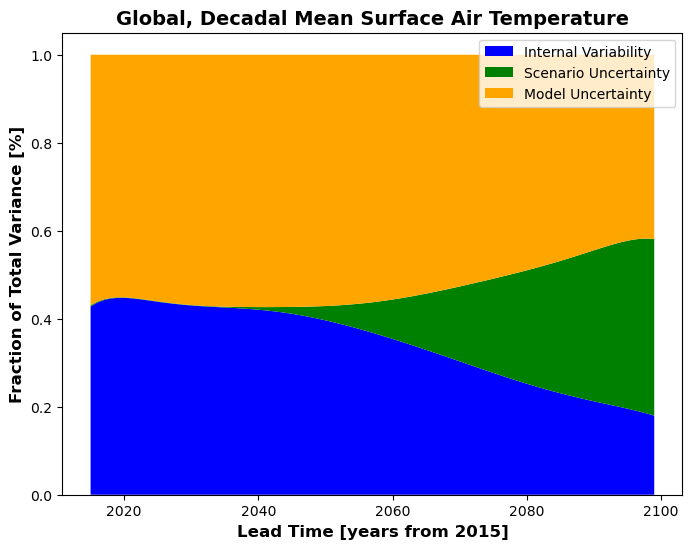

In [777]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.stackplot(
    I_mean.year,
    I_mean,
    S_mean,
    M_mean,
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Global, Decadal Mean Surface Air Temperature", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

Text(160, -41, '2099')

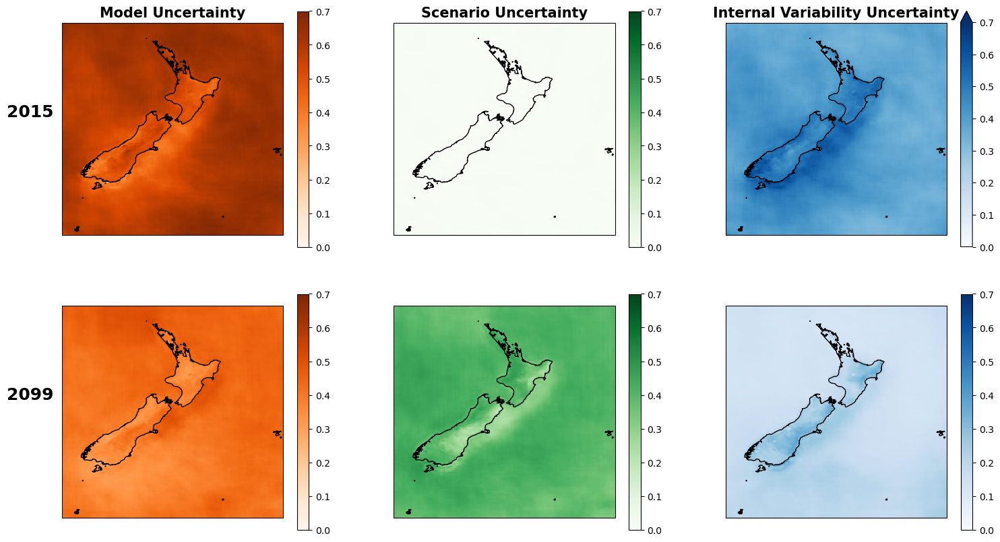

In [813]:
fig, ax = plt.subplots(2,3, figsize = (18, 10), subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)))
M_.isel(year =-1).plot(ax =ax[1,0], cmap ='Oranges', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
S_.isel(year =-1).plot(ax =ax[1,1], cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
I_.isel(year =-1).plot(ax =ax[1,2], cmap ='Blues', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())

M_.isel(year =0).plot(ax =ax[0,0], cmap ='Oranges', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
S_.isel(year =0).plot(ax =ax[0,1], cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
I_.isel(year =0).plot(ax =ax[0,2], cmap ='Blues', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
ax[1,0].set_title(' ')
ax[1,1].set_title(' ')
ax[1,2].set_title(' ')
ax[0,0].coastlines('10m')
ax[0,1].coastlines('10m')
ax[0,2].coastlines('10m')
ax[1,0].coastlines('10m')
ax[1,1].coastlines('10m')
ax[1,2].coastlines('10m')
ax[0,0].text(160, -41, '2015', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)
ax[1,0].text(160, -41, '2099', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)

In [105]:
ssps = ['ssp126','ssp245', 'ssp585']
import glob
full_dset = []
for ssp in ssps:
    #files_glob_tx = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/tasmax/tasmax_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')
    files_glob_pr = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/pr/pr_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_pr_v280125.nc')
    ssp_dset = []
    for file in files_glob_pr:
        #print(files_glob_tx)
        print(file)
        tx = xr.open_dataset(file)
        variant = file.split('/')[-1].split('_')[5]
        ssp = file.split('/')[-1].split('_')[4]
        gcm = file.split('/')[-1].split('_')[3]
        txx = tx.groupby('time.year').max()
        txx_smoothed = xr.apply_ufunc(func, txx.isel(year = slice(0, -1)), input_core_dims=[["year"]], output_core_dims =[["year"]], output_dtypes =[float], vectorize =True,
                             dask = 'parallelized')
        txx_smoothed['tasmax_resid'] = (('year','lat','lon'), (txx.isel(year = slice(0, -1)) -  txx_smoothed).pr.values)
        txx_smoothed = txx_smoothed.expand_dims({"GCM":1})
        txx_smoothed['GCM'] = (('GCM'), [gcm])
        txx_smoothed.attrs['variant'] = [variant]
        ssp_dset.append(txx_smoothed)
    concat_dset = xr.concat(ssp_dset, dim ="GCM")
    concat_dset = concat_dset.expand_dims({"ssp":1})
    concat_dset['ssp'] = (('ssp'), [ssp])
    full_dset.append(concat_dset)
        
    
    #print(len(files_glob))


/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/pr/pr_ScenarioMIP_NASA-GISS_GISS-E2-1-G_ssp126_r1i1p1f2_day_NZ12km_NIWA-REMS_pr_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/pr/pr_ScenarioMIP_MOHC_UKESM1-0-LL_ssp126_r1i1p1f2_day_NZ12km_NIWA-REMS_pr_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/pr/pr_ScenarioMIP_IPSL_IPSL-CM6A-LR_ssp126_r1i1p1f1_day_NZ12km_NIWA-REMS_pr_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/pr/pr_ScenarioMIP_CSIRO_ACCESS-ESM1-5_ssp126_r1i1p1f1_day_NZ12km_NIWA-REMS_pr_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/pr/pr_ScenarioMIP_EC-Earth-Consortium_EC-Earth3-Veg-LR_ssp126_r1i1p1f1_day_NZ12km_NIWA-REMS_pr_v280125.nc
/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp126/daily/pr/pr_ScenarioMIP_INM_INM-CM4-8_ssp126_r1i1p1f1_day_NZ12km_NI

In [106]:
concats = xr.concat(full_dset, dim ="ssp")

In [108]:
concats = xr.concat(full_dset, dim ="ssp")
concats.to_netcdf('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/RX1day_internal_variability_smoothing_decomposition_contribution.nc')

In [150]:
I = concats.tasmax_resid.var(["year"]).mean(["GCM","ssp"])
M = concats.var("GCM").mean("ssp").pr
S = concats.mean("GCM").var("ssp").pr
T = S + M + I
S_ = S/T
M_ = M/T
I_ = I/T

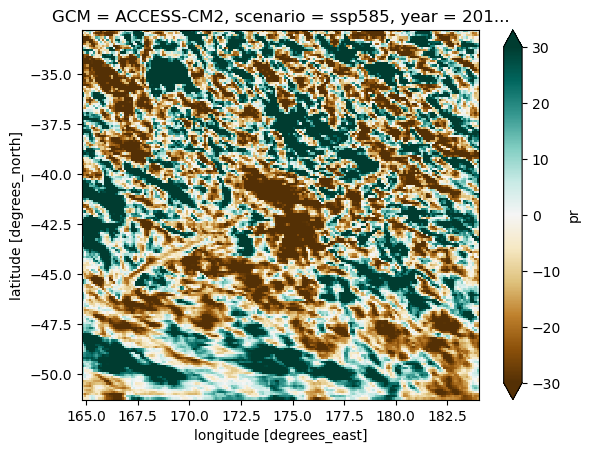

In [145]:
(100*(concats.pr.isel(ssp=1, GCM =6).isel(year =-1)- concats.pr.isel(ssp=2, GCM =0).isel(year =0))/concats.pr.isel(ssp=2, GCM =0).isel(year =0)).plot(vmin =-30, vmax =30, cmap ='BrBG')#.sel(lat =lat, lon=lon, method ='nearest').plot()

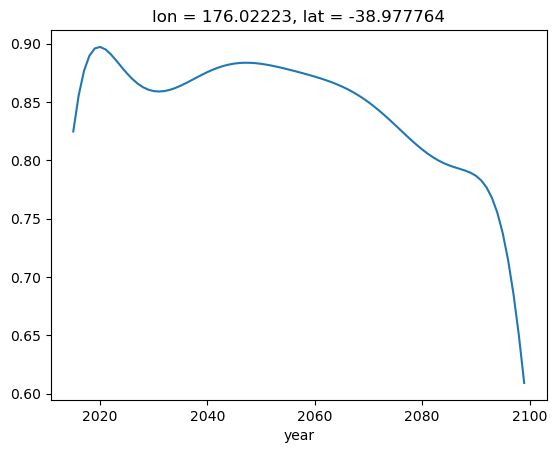

In [152]:
#T.sel(lat =lat, lon =lon, method ='nearest').plot()
I_.sel(lat =lat, lon =lon, method ='nearest').plot()

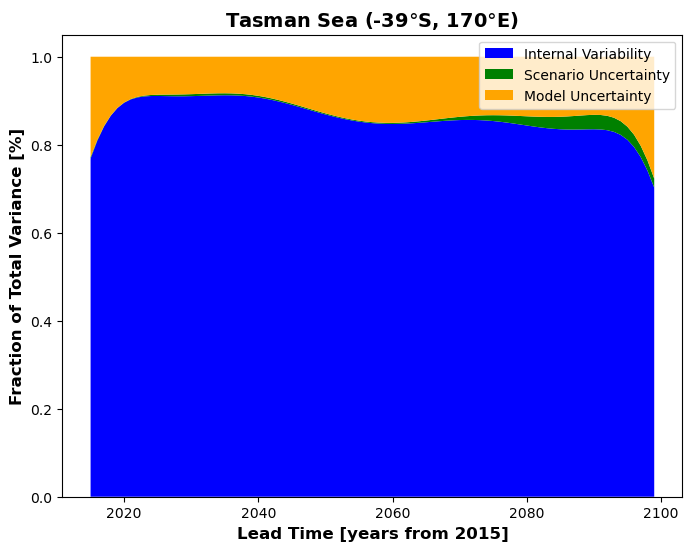

In [155]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 170
ax.stackplot(
    I_.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Tasman Sea (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()


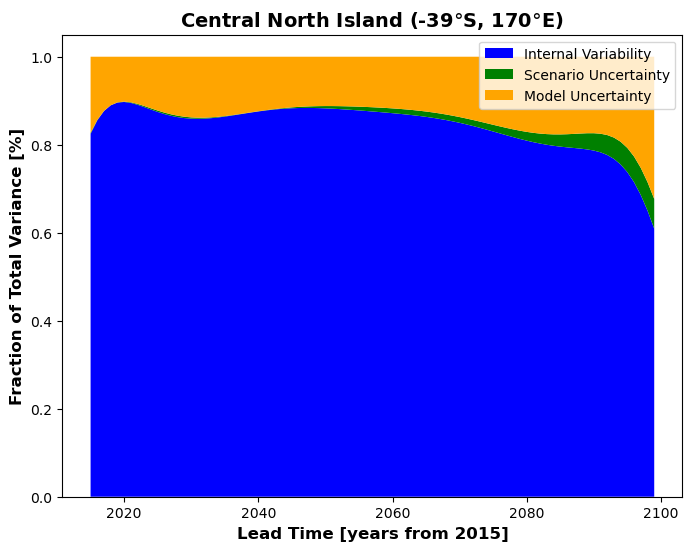

In [157]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 176
ax.stackplot(
    I_.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Central North Island (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()


Text(160, -41, '2099')

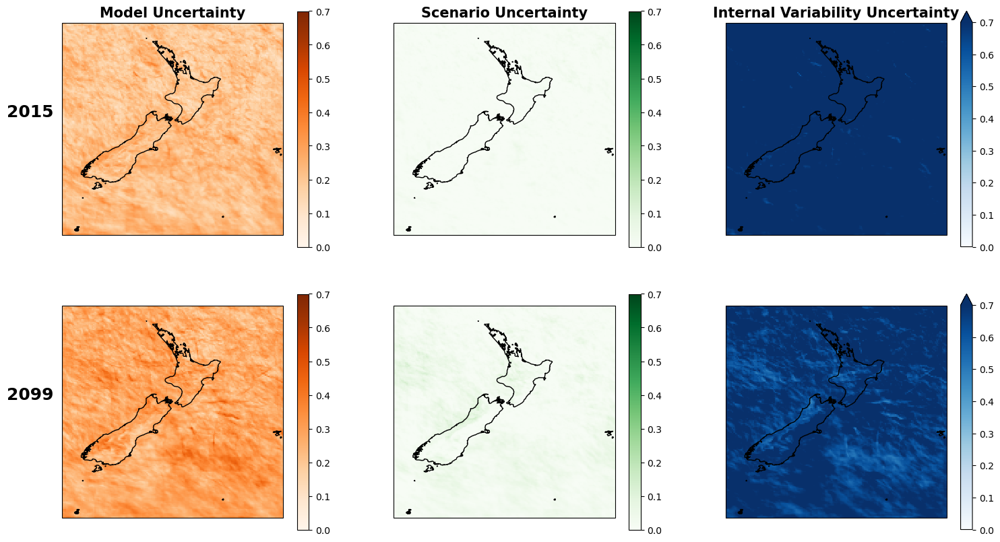

In [158]:
fig, ax = plt.subplots(2,3, figsize = (18, 10), subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)))
M_.isel(year =-1).plot(ax =ax[1,0], cmap ='Oranges', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
S_.isel(year =-1).plot(ax =ax[1,1], cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
I_.isel(year =-1).plot(ax =ax[1,2], cmap ='Blues', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())

M_.isel(year =0).plot(ax =ax[0,0], cmap ='Oranges', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
S_.isel(year =0).plot(ax =ax[0,1], cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
I_.isel(year =0).plot(ax =ax[0,2], cmap ='Blues', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
ax[1,0].set_title(' ')
ax[1,1].set_title(' ')
ax[1,2].set_title(' ')
ax[0,0].coastlines('10m')
ax[0,1].coastlines('10m')
ax[0,2].coastlines('10m')
ax[1,0].coastlines('10m')
ax[1,1].coastlines('10m')
ax[1,2].coastlines('10m')
ax[0,0].text(160, -41, '2015', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)
ax[1,0].text(160, -41, '2099', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)

In [ ]:
ssps = ['ssp370']
full_dset = []
for ssp in ssps:
    #files_glob_tx = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/tasmax/tasmax_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')
    files_glob_pr = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/pr/pr_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_pr_v280125.nc')
    ssp_dset = []
    for file in files_glob_pr:
        print('na')
        if ('CanESM5' in file) | ('ACCESS-ESM1-5' in file):
            #print(files_glob_tx)
            
            tx = xr.open_dataset(file)
            variant = file.split('/')[-1].split('_')[5]
            ssp = file.split('/')[-1].split('_')[4]
            gcm = file.split('/')[-1].split('_')[3]
            print(gcm, variant, ssp)
            txx = tx.groupby('time.year').max()
            txx_smoothed = xr.apply_ufunc(func, txx.isel(year = slice(0, -1)), input_core_dims=[["year"]], output_core_dims =[["year"]], output_dtypes =[float], vectorize =True,
                                 dask = 'parallelized')
            txx_smoothed['tasmax_resid'] = (('year','lat','lon'), (txx.isel(year = slice(0, -1)) -  txx_smoothed).pr.values)
            txx_smoothed = txx_smoothed.expand_dims({"GCM_variant":1})
            txx_smoothed['GCM_variant'] = (('GCM_variant'), [f'{gcm}_{variant}'])
            txx_smoothed.attrs['variant'] = [variant]
            ssp_dset.append(txx_smoothed)
    concat_dset = xr.concat(ssp_dset, dim ='GCM_variant')
    concat_dset = concat_dset.expand_dims({"ssp":1})
    concat_dset['ssp'] = (('ssp'), [ssp])
    full_dset.append(concat_dset)
        
    
    

# Seems like there are some interesting results with this large ensemble

In [161]:
ssps = ['ssp370']
full_dset = []
for ssp in ssps:
    #files_glob_tx = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/tasmax/tasmax_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')
    files_glob_pr = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/pr/pr_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_pr_v280125.nc')
    ssp_dset = []
    for file in files_glob_pr:
        print('na')
        if ('CanESM5' in file) | ('ACCESS-ESM1-5' in file):
            #print(files_glob_tx)
            
            tx = xr.open_dataset(file)
            variant = file.split('/')[-1].split('_')[5]
            ssp = file.split('/')[-1].split('_')[4]
            gcm = file.split('/')[-1].split('_')[3]
            print(gcm, variant, ssp)
            txx = tx.groupby('time.year').max()
            txx_smoothed = xr.apply_ufunc(func, txx.isel(year = slice(0, -1)), input_core_dims=[["year"]], output_core_dims =[["year"]], output_dtypes =[float], vectorize =True,
                                 dask = 'parallelized')
            txx_smoothed['tasmax_resid'] = (('year','lat','lon'), (txx.isel(year = slice(0, -1)) -  txx_smoothed).pr.values)
            txx_smoothed = txx_smoothed.expand_dims({"GCM_variant":1})
            txx_smoothed['GCM_variant'] = (('GCM_variant'), [f'{gcm}_{variant}'])
            txx_smoothed.attrs['variant'] = [variant]
            ssp_dset.append(txx_smoothed)
    concat_dset = xr.concat(ssp_dset, dim ='GCM_variant')
    concat_dset = concat_dset.expand_dims({"ssp":1})
    concat_dset['ssp'] = (('ssp'), [ssp])
    full_dset.append(concat_dset)
        
    
    

na
ACCESS-ESM1-5 r23i1p1f1 ssp370
na
CanESM5 r3i1p2f1 ssp370
na
na
ACCESS-ESM1-5 r2i1p1f1 ssp370
na
ACCESS-ESM1-5 r27i1p1f1 ssp370
na
ACCESS-ESM1-5 r36i1p1f1 ssp370
na
na
ACCESS-ESM1-5 r28i1p1f1 ssp370
na
ACCESS-ESM1-5 r24i1p1f1 ssp370
na
ACCESS-ESM1-5 r33i1p1f1 ssp370
na
na
ACCESS-ESM1-5 r20i1p1f1 ssp370
na
na
na
CanESM5 r8i1p1f1 ssp370
na
na
ACCESS-ESM1-5 r32i1p1f1 ssp370
na
na
ACCESS-ESM1-5 r29i1p1f1 ssp370
na
na
CanESM5 r7i1p2f1 ssp370
na
ACCESS-ESM1-5 r18i1p1f1 ssp370
na
ACCESS-ESM1-5 r13i1p1f1 ssp370
na
na
ACCESS-ESM1-5 r25i1p1f1 ssp370
na
ACCESS-ESM1-5 r9i1p1f1 ssp370
na
ACCESS-ESM1-5 r21i1p1f1 ssp370
na
na
CanESM5 r5i1p1f1 ssp370
na
na
ACCESS-ESM1-5 r15i1p1f1 ssp370
na
CanESM5 r9i1p1f1 ssp370
na
na
ACCESS-ESM1-5 r1i1p1f1 ssp370
na
ACCESS-ESM1-5 r17i1p1f1 ssp370
na
ACCESS-ESM1-5 r8i1p1f1 ssp370
na
CanESM5 r8i1p2f1 ssp370
na
na
ACCESS-ESM1-5 r39i1p1f1 ssp370
na
ACCESS-ESM1-5 r35i1p1f1 ssp370
na
na
CanESM5 r1i1p1f1 ssp370
na
ACCESS-ESM1-5 r7i1p1f1 ssp370
na
ACCESS-ESM1-5 r16i1p1f1

In [162]:
concats = xr.concat(full_dset, dim ="ssp")
concats.to_netcdf('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/RX1day_internal_variability_smoothing_decomposition_actual_IV.nc')

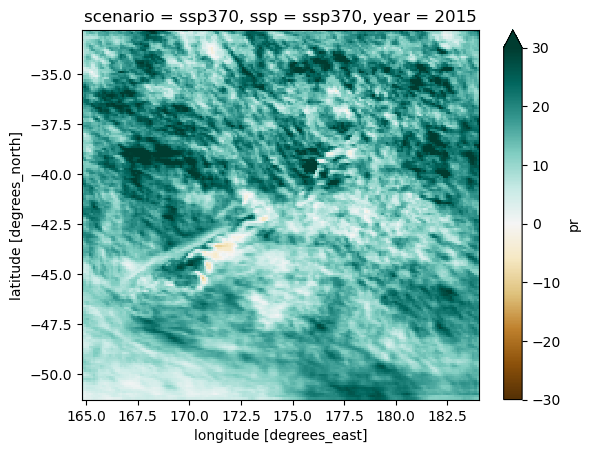

In [172]:
(100* ((concats.pr.isel(year =-1) - concats.pr.isel(year =0))/concats.pr.isel(year =0)).sel(GCM_variant = concats.GCM == 'ACCESS-ESM1-5').mean(["GCM_variant"]).squeeze()).plot(vmin =-30, vmax =30, cmap ='BrBG')

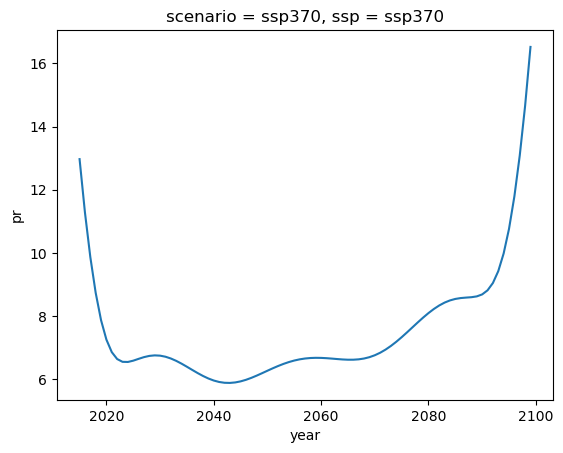

In [178]:
concats.pr.std(["GCM_variant"]).squeeze().mean(["lat","lon"]).plot()

In [174]:
z1 = (concats.sel(GCM_variant = concats.GCM == 'ACCESS-ESM1-5').pr + concats.sel(GCM_variant = concats.GCM == 'ACCESS-ESM1-5').tasmax_resid)

In [187]:
variance = z1.var(["GCM_variant"])

In [ ]:
# Some queit interesint properties of Rx1day in this large ensemble 

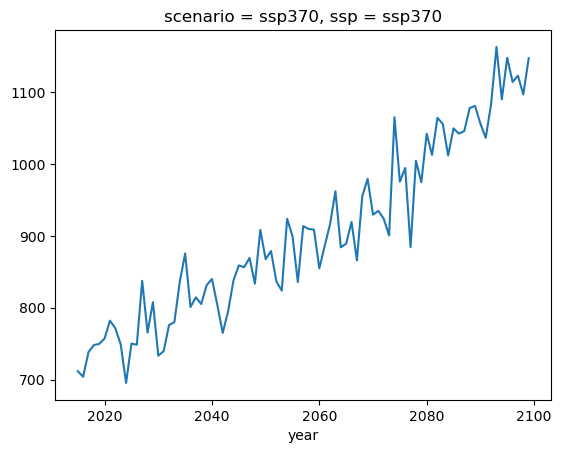

In [191]:
variance .mean(["lat","lon"]).plot()

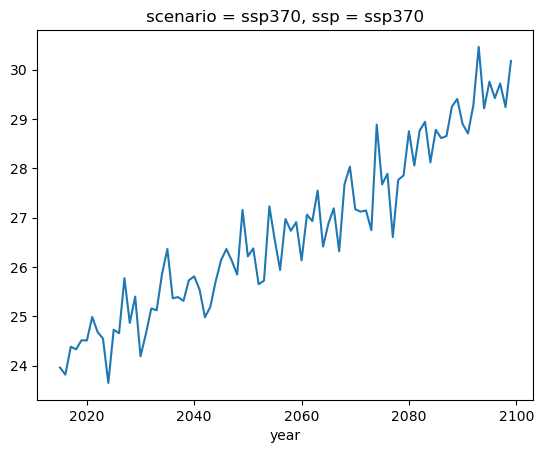

In [180]:
z1.std(["GCM_variant"]).squeeze().mean(["lat","lon"]).plot()

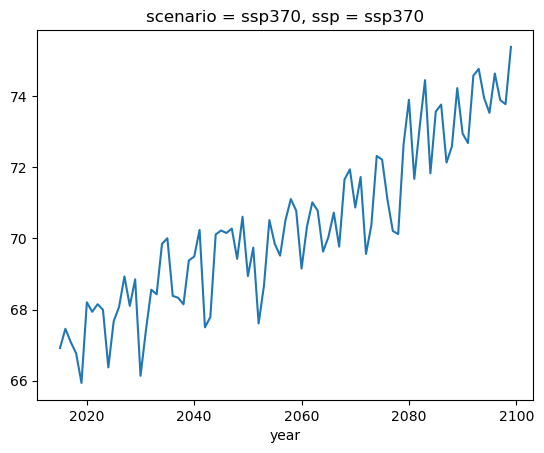

In [181]:
z1.mean(["GCM_variant"]).squeeze().mean(["lat","lon"]).plot()
z1.mean(["GCM_variant"]).squeeze().mean(["lat","lon"]).plot()

In [656]:
files_glob_tx = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/{ssp}/daily/tasmax/tasmax_ScenarioMIP_*{ssp}*_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')

In [665]:
gcm

'CanESM5'

In [618]:
tx = xr.open_dataset(r'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CCCma_CanESM5_ssp370_r7i1p2f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')
pr = xr.open_dataset(r'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/pr/pr_ScenarioMIP_CCCma_CanESM5_ssp370_r7i1p2f1_day_NZ12km_NIWA-REMS_pr_v280125.nc')

In [619]:
txx = tx.groupby('time.year').max()
pr = pr.groupby('time.year').max()

In [645]:
pr_smoothed = xr.apply_ufunc(func, pr.isel(year = slice(0, -1)), input_core_dims=[["year"]], output_core_dims =[["year"]], output_dtypes =[float], vectorize =True,
                             dask = 'parallelized')

In [649]:
pr_smoothed

<xarray.Dataset>
Dimensions:   (lat: 172, lon: 179, year: 85)
Coordinates:
  * lon       (lon) float32 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0
  * lat       (lat) float32 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86
    GCM       <U7 'CanESM5'
    scenario  <U6 'ssp370'
  * year      (year) int64 2015 2016 2017 2018 2019 ... 2095 2096 2097 2098 2099
Data variables:
    pr        (lat, lon, year) float64 27.79 27.84 27.89 ... 120.8 121.2 121.7

In [648]:
txx_smoothed = xr.apply_ufunc(func, txx.isel(year = slice(0, -1)), input_core_dims=[["year"]], output_core_dims =[["year"]], output_dtypes =[float], vectorize =True,
                             dask = 'parallelized')

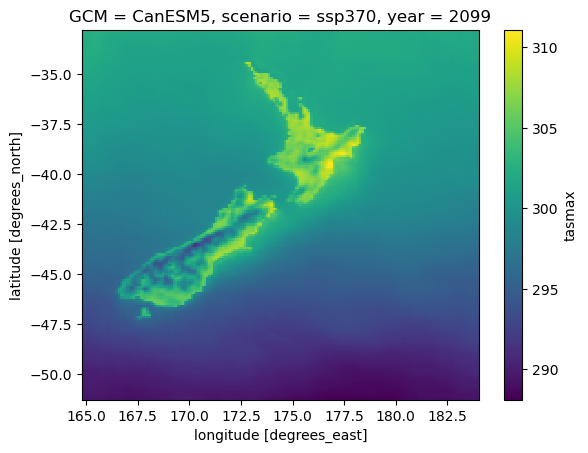

In [651]:
txx_smoothed.isel(year =-1).tasmax.plot()

In [627]:
pr.year

<xarray.DataArray 'year' (year: 86)>
array([2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026,
       2027, 2028, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036, 2037, 2038,
       2039, 2040, 2041, 2042, 2043, 2044, 2045, 2046, 2047, 2048, 2049, 2050,
       2051, 2052, 2053, 2054, 2055, 2056, 2057, 2058, 2059, 2060, 2061, 2062,
       2063, 2064, 2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2073, 2074,
       2075, 2076, 2077, 2078, 2079, 2080, 2081, 2082, 2083, 2084, 2085, 2086,
       2087, 2088, 2089, 2090, 2091, 2092, 2093, 2094, 2095, 2096, 2097, 2098,
       2099, 2100])
Coordinates:
    GCM       <U7 'CanESM5'
    scenario  <U6 'ssp370'
  * year      (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100

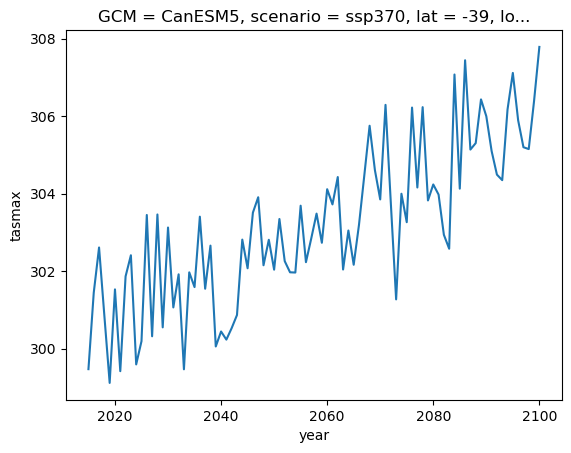

In [624]:
#pr.pr.interp(lat =-39, lon =176, method ='nearest').plot()
txx.tasmax.interp(lat =-39, lon =176, method ='nearest').plot()

In [544]:

# Define lists
gcm = [
    "MPI-ESM1-2-HR", "ACCESS-CM2", "ACCESS-ESM1-5", "GISS-E2-1-G", "INM-CM4-8",
    "INM-CM5-0", "EC-Earth3", "TaiESM1", "IPSL-CM6A-LR", "MPI-ESM1-2-LR", "NorESM2-LM",
    "NorESM2-MM", "CanESM5", "UKESM1-0-LL", "IITM-ESM", "CMCC-ESM2", "EC-Earth3-Veg-LR",
    "CNRM-CM6-1", "EC-Earth3-Veg", "CMCC-CM2-SR5"
]

variant = [
    "r1i1p1f1", "r4i1p1f1", "r1i1p1f1", "r1i1p1f2", "r1i1p1f1",
    "r1i1p1f1", "r1i1p1f1", "r1i1p1f1", "r1i1p1f1", "r1i1p1f1", "r1i1p1f1",
    "r1i1p1f1", "r1i1p1f1", "r1i1p1f2", "r1i1p1f1", "r1i1p1f1",
    "r1i1p1f1", "r1i1p1f2", "r1i1p1f1", "r1i1p1f1"
]
ssps = ['ssp126','ssp245','ssp370','ssp585']
for i in range(len(gcm)):
    variants = variant[i]
    gcms = gcm[i]
    historical_run = xr.open_mfdataset(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/historical/daily/pr*{gcms}.nc')
    for ssp in ssps:
        df = xr.open_mfdataset(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/historical/daily/pr*{gcms}.nc')



KeyboardInterrupt



In [557]:
files =glob.glob(f'//nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/historical/daily/*.nc')
files

[]

In [552]:
historical_run = xr.open_mfdataset(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/historical/daily/pr_CMIP_*{gcms}_historical_{variants}_day_NZ12km_NIWA-REMS_pr_v280125.nc')

OSError: no files to open

In [548]:
f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/CMIP/*.nc'){gcms}/historical/{variants}/day/pr/NZ_Domain/*.nc'

'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/CMIP/*/MPI-ESM1-2-HR/historical/r1i1p1f1/day/pr/NZ_Domain/*.nc'

In [546]:
historical_run = xr.open_mfdataset(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/CMIP/*/{gcms}/historical/{variants}/day/pr/NZ_Domain/*/pr*{gcms}*{variants}_*_pr_v280125.nc')

OSError: no files to open

In [541]:
f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/CMIP/*/{gcms}/historical/{variants}/day/pr/NZ_Domain/v20190429/pr_CMIP_*_{gcms}_historical_{variants}_day_NZ12km_NIWA-REMS_pr_v280125.nc'

'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/CMIP/*/MPI-ESM1-2-HR/historical/r1i1p1f1/day/pr/NZ_Domain/v20190429/pr_CMIP_*_MPI-ESM1-2-HR_historical_r1i1p1f1_day_NZ12km_NIWA-REMS_pr_v280125.nc'

In [528]:
rolling_max = df1.pr.groupby('time.year').max()#.rolling(year =5).mean()

In [532]:
z = rolling_max.interp(lat =-39, lon =176, method ='nearest').to_pandas()

In [538]:
coefficients = np.polyfit(z.index.ravel(), z.values.ravel(), 3)

# Create a polynomial function from the coefficients
polynomial = np.poly1d(coefficients)

# Generate x values for plotting the polynomial curve
x_fit = np.linspace(z.index.ravel().min(), z.index.ravel().max(), 500)
y_fit = polynomial(x_fit)

/tmp/ipykernel_177009/790876850.py:1: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  coefficients = np.polyfit(z.index.ravel(), z.values.ravel(), 3)
/tmp/ipykernel_177009/790876850.py:7: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  x_fit = np.linspace(z.index.ravel().min(), z.index.ravel().max(), 500)


/tmp/ipykernel_177009/1620391204.py:2: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  plt.plot(z.index.ravel(), z.values.ravel())


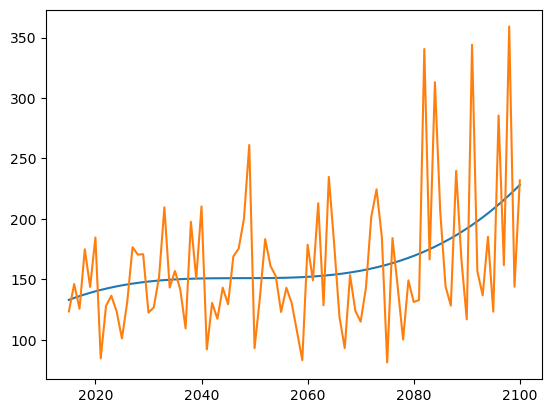

In [539]:
plt.plot(x_fit, y_fit)
plt.plot(z.index.ravel(), z.values.ravel())

In [288]:
data_reconstructed = pca.inverse_transform(data_pca)
data_reconstructed.shape


(20, 11491)

In [274]:
data_pca

array([[-1013.32316776,  -373.95569057],
       [  999.15454602,     5.43119955],
       [  133.71009589,  -621.00918851],
       [  685.12216503,     2.36997911],
       [ -425.50658375,  -414.05131606],
       [ -934.33564153,   177.76283681],
       [  111.09167659,   901.03688855],
       [ -311.61844112,  -269.23831649],
       [-1472.91489635,  -495.2644406 ],
       [ -573.00159241,   474.08374743],
       [-1222.06378098,   138.43702003],
       [ 2209.51481415,  -227.49525606],
       [ 1445.48178007,  -737.12580305],
       [  719.33462617,  1098.21001898],
       [  134.5662823 ,  -145.70148708],
       [ -413.61948532,   275.05686288],
       [ -977.95568065,  -136.45241342],
       [  306.37732693,  1334.32519389],
       [  446.31680791,  -904.88591815],
       [  153.66914878,   -81.53391723]])

In [ ]:
from sk

(-15.0, 25.0)

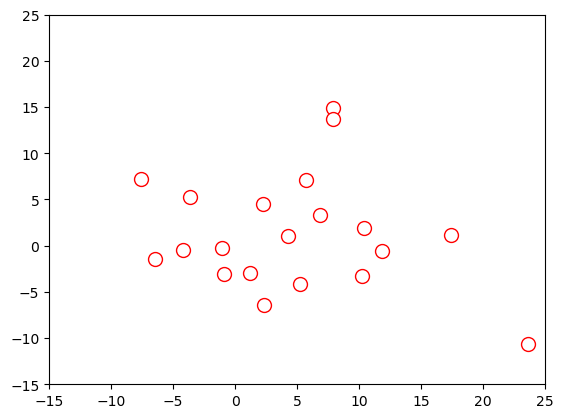

In [265]:
fig, ax = plt.subplots()
ax.scatter(concat_djf.PR.mean(["latitude","longitude"]).values.ravel(), concat_jja.PR.mean(["latitude","longitude"]).values.ravel(), color ='r', s =100, fc ='white')
ax.set_xlim(-15, 25)
ax.set_ylim(-15, 25)

<xarray.Dataset>
Dimensions:  (GCM: 20)
Coordinates:
  * GCM      (GCM) <U16 'MPI-ESM1-2-HR' 'TaiESM1' ... 'NorESM2-MM'
Data variables:
    PR       (GCM) float64 -1.046 11.82 7.898 10.36 ... -3.603 5.754 10.21 6.879

In [ ]:
concat_future.plot(col 

In [ ]:
# Inidices are not finished 
# with internal varibility we will finish the indices

In [237]:
files_ai = glob.glob(r'/nesi/nobackup/niwa03712/CCAM_Indicators/output/ssp370/static_maps/TX/*_fp2080-2099_bp1986-2005_DJF_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_TX = xr.concat(dfs, dim ="GCM")
gcm = [files[i].split('_')[5] for i in range(len(files))]


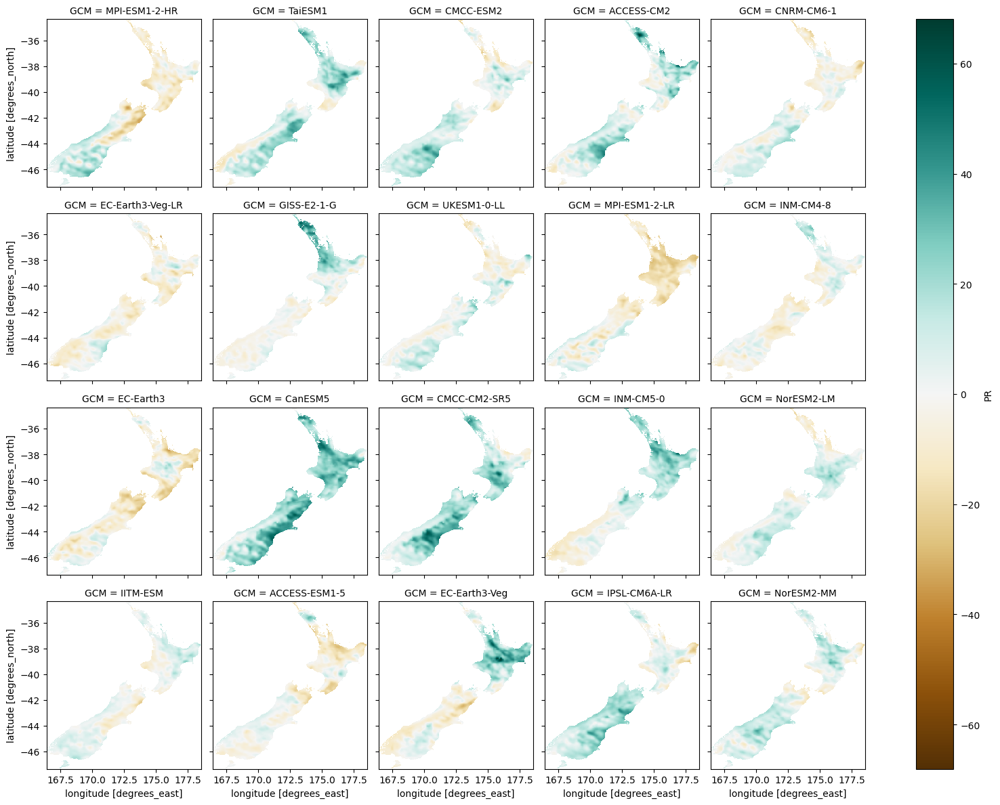

In [241]:
concat_future.PR.plot(col ="GCM", col_wrap =5, cmap ='BrBG')

In [607]:
season = 'ANN'
files_ai = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/ssp370/static_maps/PR/*_fp2080-2099_bp1986-2005_{season}_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_future = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[6] for i in range(len(files_ai))]
concat_future['GCM'] = (('GCM'), gcm)

files_ai = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/PR/*bp1986-2005_{season}_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_base = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[6] for i in range(len(files_ai))]
concat_base['GCM'] = (('GCM'), gcm)

concat_jja = 100 * concat_future/concat_base

In [609]:
files_ai = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/ssp370/static_maps/TX/*_fp2080-2099_bp1986-2005_{season}_NZ12km.nc')

In [613]:
len(glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/ssp370/static_maps/TX/*_fp2080-2099_bp1986-2005_{season}_NZ12km.nc'))

13

In [591]:
season = 'ANN'
files_ai = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/ssp370/static_maps/TX/*_fp2080-2099_bp1986-2005_{season}_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_future = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
concat_future['GCM'] = (('GCM'), gcm)

files_ai = glob.glob(f'/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/TX/*bp1986-2005_{season}_NZ12km.nc')
dfs = []
for file in files_ai:
    df = xr.open_dataset(file)
    dfs.append(df.squeeze().drop("time"))
concat_base = xr.concat(dfs, dim ="GCM")
gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
concat_base['GCM'] = (('GCM'), gcm)

concat_TX = 100 * concat_future/concat_base

ValueError: cannot reindex or align along dimension 'GCM' because the index has duplicate values

In [594]:
files_ai

['/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/TX/TX_historical_ACCESS-ESM1-5_CCAM_base_bp1986-2005_ANN_NZ12km.nc',
 '/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/TX/TX_historical_MPI-ESM1-2-HR_CCAM_base_bp1986-2005_ANN_NZ12km.nc',
 '/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/TX/TX_historical_CMCC-ESM2_r1i1p1f1_base_bp1986-2005_ANN_NZ12km.nc',
 '/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/TX/TX_historical_CMCC-CM2-SR5_r1i1p1f1_base_bp1986-2005_ANN_NZ12km.nc',
 '/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/TX/TX_historical_NorESM2-LM_r1i1p1f1_base_bp1986-2005_ANN_NZ12km.nc',
 '/nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output/historical/static_maps/TX/TX_historical_EC-Earth3-Veg_r1i1p1f1_base_bp1986-2005_ANN_NZ

In [590]:
concat_jja

<xarray.Dataset>
Dimensions:    (longitude: 243, latitude: 260, GCM: 20)
Coordinates:
  * longitude  (longitude) float64 166.4 166.5 166.5 166.6 ... 178.4 178.5 178.5
  * latitude   (latitude) float64 -34.38 -34.42 -34.47 ... -47.22 -47.28 -47.33
  * GCM        (GCM) <U10 'maps/PR/PR' 'maps/PR/PR' ... 'maps/PR/PR'
Data variables:
    PR         (GCM, latitude, longitude) float64 nan nan nan ... nan nan nan